# Digital Image Processing - Assignment 2
### Laksh Nanwani - 2021701002 - MS CSE - laksh.nanwani@research.iiit.ac.in

---

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import time

In [3]:
def readRgbImage(img_name):
    path = "../images/" + img_name
    return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

def readImageAsGray(img_name):
    path = "../images/" + img_name
    return cv2.imread(path, cv2.IMREAD_GRAYSCALE)

def showImage(gray_img, v_min = 0, v_max = 255, c_map = 'gray'):
    plt.imshow(gray_img, cmap = c_map, vmin = v_min, vmax = v_max) 
    plt.axis('off')
    plt.show()

## 1. Linear Spatial Filters

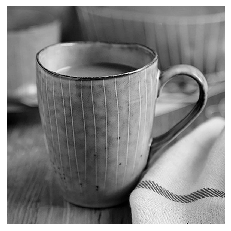

In [3]:
ceramic_img = readImageAsGray("ceramic.jpg")
showImage(ceramic_img)

__1. Implement an algorithm for low-pass filtering a grayscale image by moving a k × k
averaging filter of the form ones((k,k))/(k<sup>2</sup>).
<br>Try with k = 3, 5, 7, 11 and 13.
<br>(Note: Ones((k,k))/(k<sup>2</sup>) implies a filter with all the entries of a k*k matrix as 1/(k<sup>2</sup>).__

In [158]:
def apply_kernel_single(img, kernel, new_channel_shape):
    new_img = np.zeros(new_channel_shape, int)
    for i in range(new_channel_shape[0]):
        for j in range(new_channel_shape[1]):
            new_img[i][j] = np.round(np.sum(img[i:i + kernel.shape[0], j:j + kernel.shape[1]] * kernel))
    return new_img

def apply_kernel(img, kernel, zero_padding = 0):
    in_img = np.zeros((img.shape[0] + 2 * zero_padding, img.shape[1] + 2 * zero_padding), int)
    in_img[zero_padding : in_img.shape[0] - zero_padding, zero_padding : in_img.shape[1] - zero_padding] = img
    
    new_h, new_w = in_img.shape[0] - kernel.shape[0] + 1, in_img.shape[1] - kernel.shape[1] + 1
    
    if len(img.shape) == 2:
        return apply_kernel_single(in_img, kernel, (new_h, new_w))
        
    new_img = np.zeros((new_h, new_w, img.shape[2]), int)
    for c in range(img.shape[2]):
        new_img[:,:,c] = apply_kernel_single(in_img[:,:,c], kernel, (new_h, new_w))
    return new_img

In [5]:
# def mean_filter(img, k):
#     k_sqr = k*k
# #     filter_ = np.ones((k,k)) / k_sqr
#     new_shape = (img.shape[0] - k + 1, img.shape[1] - k + 1)
#     new_img = np.zeros(new_shape, int)
#     for i in range(new_shape[0]):
#         for j in range(new_shape[1]):
#             new_img[i][j] = np.round(np.sum(img[i:i+k, j:j+k]) / k_sqr)
# #             new_img[i][j] = np.round(np.sum(img[i:i+k, j:j+k] * filter_))
#     return new_img

def mean_filter(img, k, zero_padding = 0):
    filter_ = np.ones((k,k)) / (k*k)
    return apply_kernel(img, filter_, zero_padding)

In [6]:
# filtered_img = mean_filter(ceramic_img, 31)
# showImage(filtered_img)
# print(ceramic_img)
# print(filtered_img)

In [7]:
# print(ceramic_img.shape)
# print(filtered_img.shape)

In [8]:
filtered_img_3 = mean_filter(ceramic_img, 3)
filtered_img_5 = mean_filter(ceramic_img, 5)
filtered_img_7 = mean_filter(ceramic_img, 7)
filtered_img_11 = mean_filter(ceramic_img, 11)
filtered_img_13 = mean_filter(ceramic_img, 13)

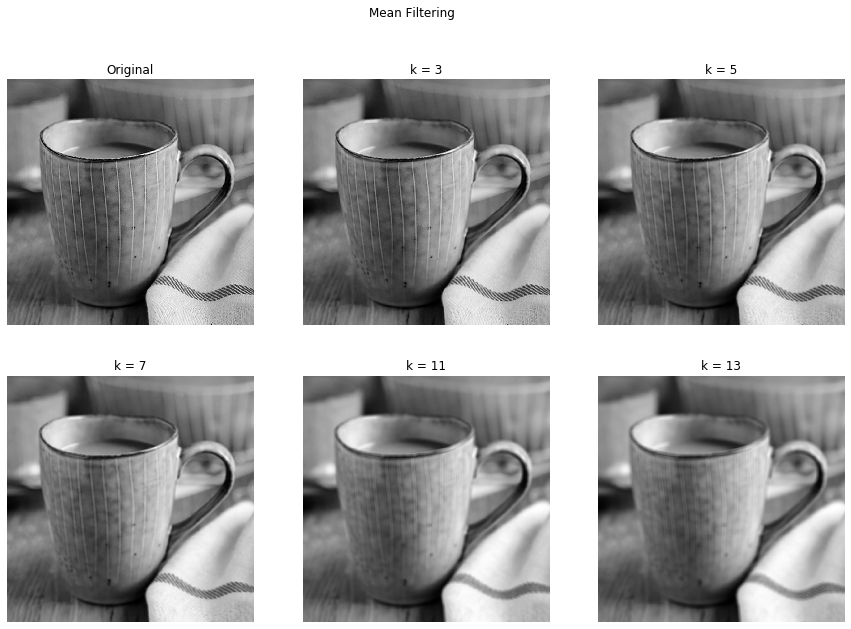

In [9]:
fig1, axes1 = plt.subplots(2, 3, figsize = (15,10))

axes1[0][0].imshow(ceramic_img, cmap = 'gray')
axes1[0][0].axis('off')
axes1[0][0].set_title("Original")

axes1[0][1].imshow(filtered_img_3, cmap = 'gray')
axes1[0][1].axis('off')
axes1[0][1].set_title("k = 3")

axes1[0][2].imshow(filtered_img_5, cmap = 'gray')
axes1[0][2].axis('off')
axes1[0][2].set_title("k = 5")

axes1[1][0].imshow(filtered_img_7, cmap = 'gray')
axes1[1][0].axis('off')
axes1[1][0].set_title("k = 7")

axes1[1][1].imshow(filtered_img_11, cmap = 'gray')
axes1[1][1].axis('off')
axes1[1][1].set_title("k = 11")

axes1[1][2].imshow(filtered_img_13, cmap = 'gray')
axes1[1][2].axis('off')
axes1[1][2].set_title("k = 13")

fig1.suptitle("Mean Filtering")
plt.show()

__2. As the filter is moved from one spatial location to the next one, the filter window
shares many common pixels in adjacent neighborhoods. Exploit this observation
and implement a more efficient version of averaging filter.__

In [159]:
def efficient_mean_filter(img, k, zero_padding = 0):
    in_img = np.zeros((img.shape[0] + 2 * zero_padding, img.shape[1] + 2 * zero_padding), int)
    in_img[zero_padding : in_img.shape[0] - zero_padding, zero_padding : in_img.shape[1] - zero_padding] = img
    
    new_h, new_w = (in_img.shape[0] - k + 1), (in_img.shape[1] - k + 1)
    
    new_img = np.zeros((new_h, new_w), int)

    cumulative_row = np.zeros((in_img.shape[0], new_w))

    # row wise culumation
    for i in range(cumulative_row.shape[0]):
        cumulative_row[i,0] = np.sum(in_img[i,0:k])
        
        for j in range(1, cumulative_row.shape[1]):
            cumulative_row[i,j] += cumulative_row[i,j-1] + in_img[i,j+k-1] - in_img[i,j-1]
    
    # column wise culumation
    for j in range(new_w):
        new_img[0,j] = np.sum(cumulative_row[0:k,j])
        
        for i in range(1,new_h):
            new_img[i,j] += new_img[i-1,j] + cumulative_row[i+k-1,j] - cumulative_row[i-1,j]

    return new_img // k**2

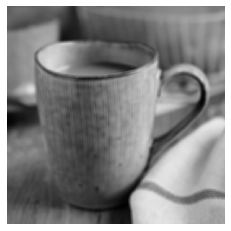

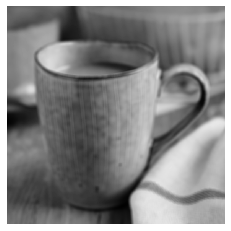

In [11]:
filtered_img_eff = efficient_mean_filter(ceramic_img, 13)
showImage(filtered_img_eff)

filtered_img = mean_filter(ceramic_img, 13)
showImage(filtered_img)
# print(ceramic_img)
# print(filtered_img)

In [12]:
# print(filtered_img_eff,"\n", filtered_img)

__3. To appreciate the benefits of the efficient version, generate a plot of k vs run-time
for multiple images of different sizes (8x8, 16x16, 32x32, .. 512x512) by resizing
ceramic.jpg. The plot diagram should contain a line plot for each image size.
Use different marker types to distinguish the default implementation and improved
implementation.
<br>Just to give you a rough idea, look at https://imgur.com/a/0HtYlTE.__

In [13]:
img_size = 4
k_ = range(3,14,2)
x_all = []
time_slow_filter = []
time_fast_filter = []
for i in range(7):
    img_size *= 2
    new_ceramic_img = cv2.resize(ceramic_img, (img_size, img_size))
    time_slow_filter_temp = []
    time_fast_filter_temp = []
    x = []
    for k in k_:
        if k < img_size:
            x.append(k)
            start_time = time.time()
            mean_filter(new_ceramic_img, k)
            end_time = time.time()
            time_slow_filter_temp.append((end_time - start_time)*100)
            start_time = time.time()
            efficient_mean_filter(new_ceramic_img, k)
            end_time = time.time()
            time_fast_filter_temp.append((end_time - start_time)*100)
    x_all.append(x)
    time_slow_filter.append(time_slow_filter_temp)
    time_fast_filter.append(time_fast_filter_temp)

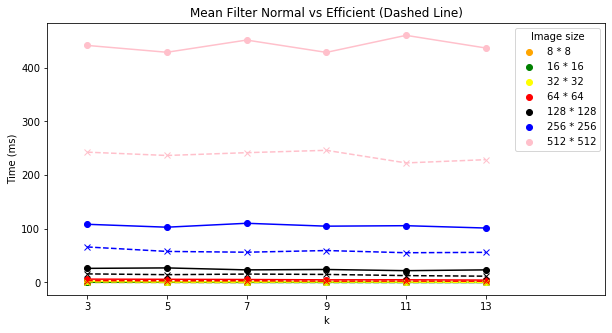

In [14]:
colors = ["orange", "green", "yellow", "red", "black", "blue", "pink"]
plt.figure(figsize=(10,5))
for i in range(len(x_all)):
    plt.plot(x_all[i], time_slow_filter[i], color = colors[i])
    img_size = str(2**(i+3))
    plt.plot(x_all[i], time_slow_filter[i], 'o', color = colors[i], label = str(img_size) + ' * ' + str(img_size))
for i in range(len(x_all)):
#     plt.plot(x_all[i], time_slow_filter[i], color = colors[i])
    plt.plot(x_all[i], time_fast_filter[i], linestyle = 'dashed', color = colors[i])
    plt.plot(x_all[i], time_fast_filter[i], 'x', color = colors[i])
plt.xlim([2,16])
plt.xticks(np.arange(3, 14, 2))
plt.xlabel("k")
plt.ylabel("Time (ms)")

plt.legend(loc = 1)
plt.legend().set_title("Image size")
# plt.rcParams["figure.figsize"] = (5,5)


# l1, = plt.plot([0],[0], '-', color=c)
# l2, = plt.plot([0],[0], '--', color=c)
# legend1 = plt.legend([l1, l2], ["Normal", "Efficient"], loc=1)
# plt.gca().add_artist(legend1)
plt.title("Mean Filter Normal vs Efficient (Dashed Line)")
plt.show()

__4. Utilize the observation similar to above to implement an efficient version of a k ×
k median filter. Generate a plot figure similar to previous question.__

In [15]:
def median_filter(img, k, zero_padding = 0):
    in_img = np.zeros((img.shape[0] + 2 * zero_padding, img.shape[1] + 2 * zero_padding), int)
    in_img[zero_padding : in_img.shape[0] - zero_padding, zero_padding : in_img.shape[1] - zero_padding] = img
    
    new_shape = (in_img.shape[0] - k + 1, in_img.shape[1] - k + 1)
    new_img = np.zeros(new_shape, int)
    for i in range(new_shape[0]):
        for j in range(new_shape[1]):
            new_img[i][j] = np.median(in_img[i:i+k, j:j+k])
    return new_img

# def efficient_median_filter(img, k):
#     new_shape = (img.shape[0] - k + 1, img.shape[1] - k + 1)
#     new_img = np.zeros(new_shape, int)

In [162]:
from sortedcontainers import SortedList

In [160]:
def efficient_median_filter(img, k, zero_padding = 0):
    in_img = np.zeros((img.shape[0] + 2 * zero_padding, img.shape[1] + 2 * zero_padding), int)
    in_img[zero_padding : in_img.shape[0] - zero_padding, zero_padding : in_img.shape[1] - zero_padding] = img
    
    new_h, new_w = (in_img.shape[0] - k + 1), (in_img.shape[1] - k + 1)
    
    new_img = np.zeros((new_h, new_w), int)

    median_along_row = np.zeros((in_img.shape[0], new_w))
    
    isEven = (k % 2 == 0)
    mid = k//2
    midnext = mid-1
    # row wise median
    
    for i in range(median_along_row.shape[0]):
        s = SortedList(in_img[i, 0:k])
        if isEven:
            median_along_row[i,0] = (s[mid] + s[midnext])/2
        else:
            median_along_row[i,0] = s[mid]
            
        for j in range(1, median_along_row.shape[1]):
            s.discard(in_img[i, j-1])
            s.add(in_img[i, j+k-1])
            if isEven:
                median_along_row[i,j] = (s[mid] + s[midnext]) / 2
            else:
                median_along_row[i,j] = s[mid]
        s.clear()
    
    # column wise median
    for j in range(new_w):
        s = SortedList(median_along_row[0:k, j])
        if isEven:
            new_img[0,j] = (s[mid] + s[midnext]) / 2
        else:
            new_img[0,j] = s[mid]
            
        for i in range(1, new_h):
            s.discard(median_along_row[i-1, j])
            s.add(median_along_row[i+k-1, j])
            new_img[i,j] = s[mid]
            if isEven:
                new_img[i,j] = (s[mid] + s[midnext]) / 2
            else:
                new_img[i,j] = s[mid]
        s.clear()

    return new_img

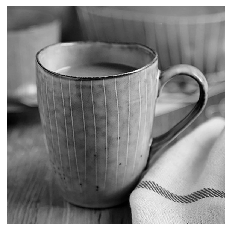

20.176343202590942


In [18]:
start_time = time.time()
filtered_image = median_filter(ceramic_img, 3)
showImage(filtered_image)
print(time.time() - start_time)

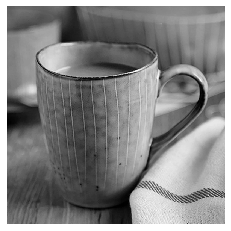

6.894280433654785


In [19]:
start_time = time.time()
filtered_image_eff = efficient_median_filter(ceramic_img, 3)
showImage(filtered_image_eff)
print(time.time() - start_time)

In [20]:
# print(filtered_image_eff, filtered_image)

In [21]:
filtered_img_3 = efficient_median_filter(ceramic_img, 3)
filtered_img_5 = efficient_median_filter(ceramic_img, 5)
filtered_img_7 = efficient_median_filter(ceramic_img, 7)
filtered_img_11 = efficient_median_filter(ceramic_img, 11)
filtered_img_13 = efficient_median_filter(ceramic_img, 13)

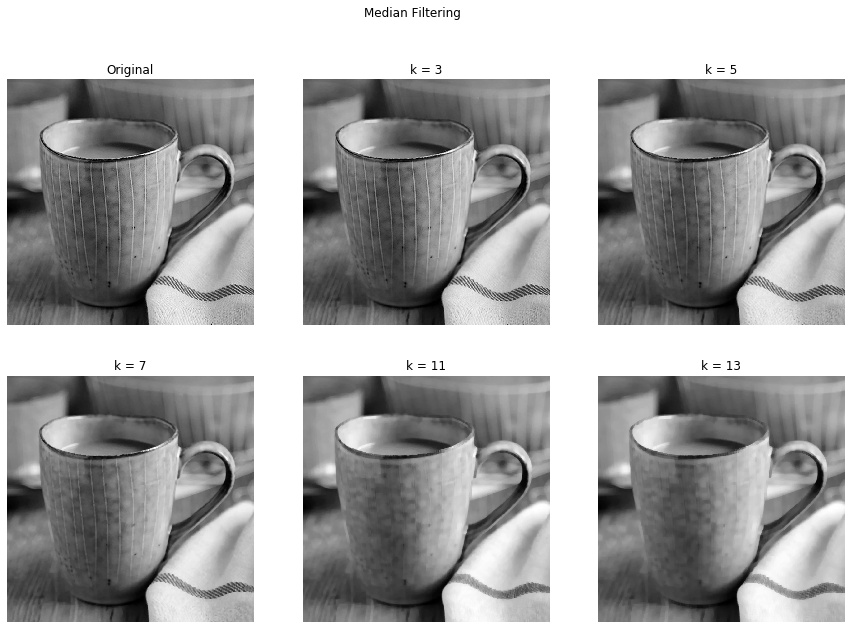

In [22]:
fig1, axes1 = plt.subplots(2, 3, figsize = (15,10))

axes1[0][0].imshow(ceramic_img, cmap = 'gray')
axes1[0][0].axis('off')
axes1[0][0].set_title("Original")

axes1[0][1].imshow(filtered_img_3, cmap = 'gray')
axes1[0][1].axis('off')
axes1[0][1].set_title("k = 3")

axes1[0][2].imshow(filtered_img_5, cmap = 'gray')
axes1[0][2].axis('off')
axes1[0][2].set_title("k = 5")

axes1[1][0].imshow(filtered_img_7, cmap = 'gray')
axes1[1][0].axis('off')
axes1[1][0].set_title("k = 7")

axes1[1][1].imshow(filtered_img_11, cmap = 'gray')
axes1[1][1].axis('off')
axes1[1][1].set_title("k = 11")

axes1[1][2].imshow(filtered_img_13, cmap = 'gray')
axes1[1][2].axis('off')
axes1[1][2].set_title("k = 13")

fig1.suptitle("Median Filtering")
plt.show()

In [23]:
img_size = 4
k_ = range(3,14,2)
x_all = []
time_slow_filter = []
time_fast_filter = []
for i in range(7):
    img_size *= 2
    new_ceramic_img = cv2.resize(ceramic_img, (img_size, img_size))
    time_slow_filter_temp = []
    time_fast_filter_temp = []
    x = []
    for k in k_:
        if k < img_size:
            x.append(k)
            start_time = time.time()
            median_filter(new_ceramic_img, k)
            end_time = time.time()
            time_slow_filter_temp.append((end_time - start_time)*100)
            start_time = time.time()
            efficient_median_filter(new_ceramic_img, k)
            end_time = time.time()
            time_fast_filter_temp.append((end_time - start_time)*100)
    x_all.append(x)
    time_slow_filter.append(time_slow_filter_temp)
    time_fast_filter.append(time_fast_filter_temp)

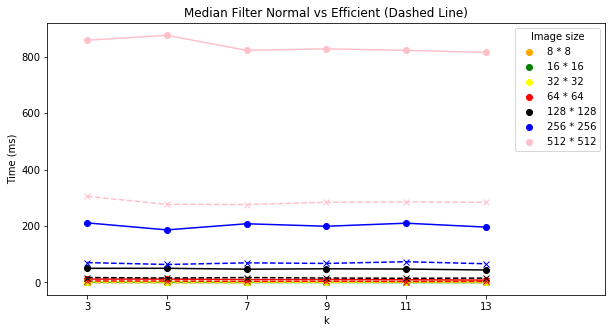

In [24]:
colors = ["orange", "green", "yellow", "red", "black", "blue", "pink"]
plt.figure(figsize=(10,5))
for i in range(len(x_all)):
    plt.plot(x_all[i], time_slow_filter[i], color = colors[i])
    img_size = str(2**(i+3))
    plt.plot(x_all[i], time_slow_filter[i], 'o', color = colors[i], label = str(img_size) + ' * ' + str(img_size))
for i in range(len(x_all)):
    plt.plot(x_all[i], time_fast_filter[i], linestyle = 'dashed', color = colors[i])
    plt.plot(x_all[i], time_fast_filter[i], 'x', color = colors[i])
plt.xlim([2,16])
plt.xticks(np.arange(3, 14, 2))
plt.xlabel("k")
plt.ylabel("Time (ms)")

plt.legend(loc = 1)
plt.legend().set_title("Image size")
plt.title("Median Filter Normal vs Efficient (Dashed Line)")
plt.show()

__5. After observing the image brainNoisy.jpg, answer the following questions:
<br>• Which filter will be the best suited to remove the noise and why?__

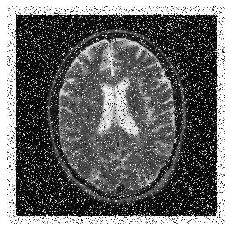

In [25]:
brainNoisy_img = readImageAsGray("brainNoisy.jpg")
showImage(brainNoisy_img)

brainNoisy.jpg contains salt and pepper noise, as can be seen above, and hence median filter is best suited to remove the noise.

__• Experiment with different filter sizes and report your observations. Which filter size is optimal?__

In [26]:
filtered_img_3 = efficient_median_filter(brainNoisy_img, 3)
filtered_img_5 = efficient_median_filter(brainNoisy_img, 5)
filtered_img_7 = efficient_median_filter(brainNoisy_img, 7)
filtered_img_9 = efficient_median_filter(brainNoisy_img, 9)
filtered_img_11 = efficient_median_filter(brainNoisy_img, 11)

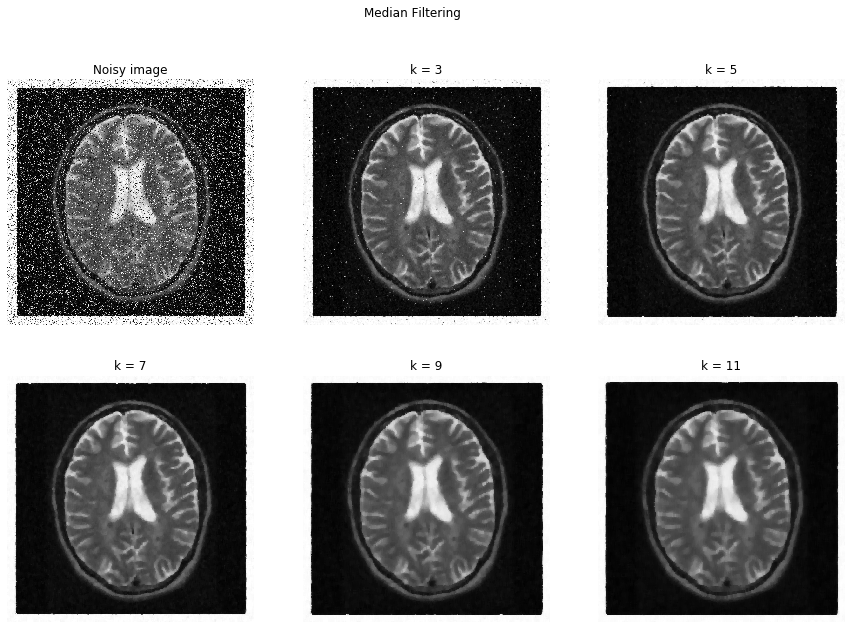

In [27]:
fig1, axes1 = plt.subplots(2, 3, figsize = (15,10))

axes1[0][0].imshow(brainNoisy_img, cmap = 'gray')
axes1[0][0].axis('off')
axes1[0][0].set_title("Noisy image")

axes1[0][1].imshow(filtered_img_3, cmap = 'gray')
axes1[0][1].axis('off')
axes1[0][1].set_title("k = 3")

axes1[0][2].imshow(filtered_img_5, cmap = 'gray')
axes1[0][2].axis('off')
axes1[0][2].set_title("k = 5")

axes1[1][0].imshow(filtered_img_7, cmap = 'gray')
axes1[1][0].axis('off')
axes1[1][0].set_title("k = 7")

axes1[1][1].imshow(filtered_img_9, cmap = 'gray')
axes1[1][1].axis('off')
axes1[1][1].set_title("k = 9")

axes1[1][2].imshow(filtered_img_11, cmap = 'gray')
axes1[1][2].axis('off')
axes1[1][2].set_title("k = 11")

fig1.suptitle("Median Filtering")
plt.show()

As the size of the median filter kernel increases, the noise gets removed in a much better way. But increase in kernel size also leads to increase in blurring as can be observed in the images above.
<br>The optimal size of kernel seems to be in the range of k = 5 to k = 7 for the given image as most of the noise has been removed and not much blurring takes place.

__• Get brainNoisy.jpg to resemble the original brain.jpg as much as possible by removing the noise.__

In [28]:
# def min_filter(img, k):
#     new_shape = (img.shape[0] - k + 1, img.shape[1] - k + 1)
#     new_img = np.zeros(new_shape, int)
#     for i in range(new_shape[0]):
#         for j in range(new_shape[1]):
#             new_img[i][j] = np.min(img[i:i+k, j:j+k])
#     return new_img

# def max_filter(img, k):
#     new_shape = (img.shape[0] - k + 1, img.shape[1] - k + 1)
#     new_img = np.zeros(new_shape, int)
#     for i in range(new_shape[0]):
#         for j in range(new_shape[1]):
#             new_img[i][j] = np.max(img[i:i+k, j:j+k])
#     return new_img

In [29]:
k = 5
original_img = readImageAsGray("brain.jpg")
# showImage(original_img)
filtered_img = efficient_median_filter(brainNoisy_img, k, 2)
# showImage(filtered_img)

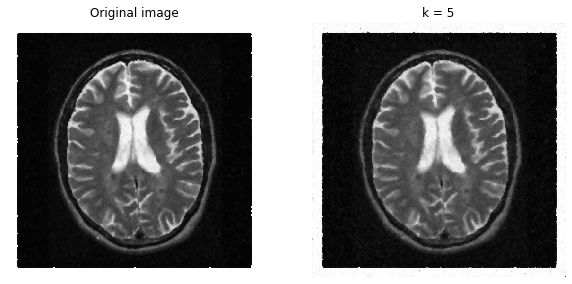

In [30]:
fig1, axes1 = plt.subplots(1,2, figsize = (10,10))

axes1[0].imshow(original_img, cmap = 'gray')
axes1[0].axis('off')
axes1[0].set_title("Original image")

axes1[1].imshow(filtered_img, cmap = 'gray')
axes1[1].axis('off')
axes1[1].set_title(f"k = {k}")

plt.show()

k = 5 gives the best result.

---

## 2. Edge Detection

__1. Read about Canny Edge detector. Apply the Canny edge detector (use inbuilt
cv2.Canny function for this task) to cup.jpg.__

__2. Tweak the values of the arguments (minVal and maxVal), and report the values.
that give the best results for each image. (Hint: Try to get a good outline of the
cup without too many fine lines.)__

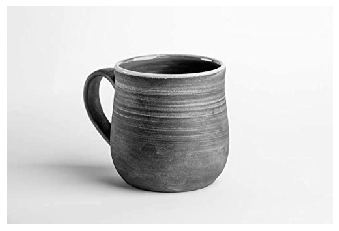

In [31]:
cup_img = readImageAsGray("cup.jpg")
showImage(cup_img)
# print(np.max(cup_img))

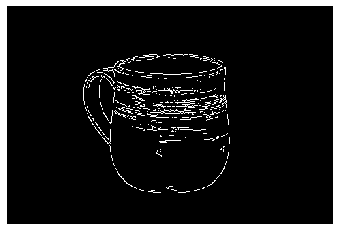

In [32]:
cup_edges = cv2.Canny(cup_img, 100, 230)
showImage(cup_edges)

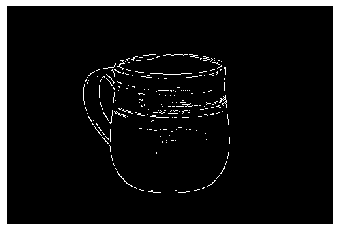

In [33]:
cup_edges = cv2.Canny(cup_img, 220, 230)
showImage(cup_edges)

Anything greater than (220, 230) seems to be giving a good result

__3. Consider Roberts, Prewitt, Sobel and Laplacian filters discussed in the class.
Implement and apply these filters on girl.jpg. and make observations upon comparing their outputs. Compare these with the output of Canny edge detector on the same image.__

In [34]:
import enum

class Gradient_Direction(enum.Enum):
    x = 'X'
    y = 'Y'
    xy = 'XY'

In [35]:
def robert_filter(img, direction, zero_padding = 0):
    if (direction == Gradient_Direction.x):
        Mx = np.array([[0, 1],
                       [-1, 0]])
        return apply_kernel(img, Mx, zero_padding)
    if (direction == Gradient_Direction.y):
        My = np.array([[0, 1],
                       [-1, 0]])
        return apply_kernel(img, My, zero_padding)
    
    Mx = np.array([[0, 1],
                   [-1, 0]])
    My = np.array([[0, 1],
                   [-1, 0]])
    return np.sqrt(apply_kernel(img, Mx, zero_padding) ** 2 + apply_kernel(img, My, zero_padding) ** 2).astype(int)

In [36]:
def prewitt_filter(img, direction, zero_padding = 0):
    if (direction == Gradient_Direction.x):
        Mx = np.array([[-1, 0, 1],
                       [-1, 0, 1],
                       [-1, 0, 1]])
        return apply_kernel(img, Mx, zero_padding)
    if (direction == Gradient_Direction.y):
        My = np.array([[1, 1, 1],
                       [0, 0, 0],
                       [-1,-1,-1]])
        return apply_kernel(img, My, zero_padding)
    
    Mx = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]])
    My = np.array([[1, 1, 1],
                   [0, 0, 0],
                   [-1,-1,-1]])
    return np.sqrt(apply_kernel(img, Mx, zero_padding) ** 2 + apply_kernel(img, My, zero_padding) ** 2).astype(int)

In [37]:
def sobel_filter(img, direction:Gradient_Direction, zero_padding = 0):
    if (direction == Gradient_Direction.x):
        Mx = np.array([[-1, 0, 1],
                       [-2, 0, 2],
                       [-1, 0, 1]])
        return apply_kernel(img, Mx, zero_padding)
    if (direction == Gradient_Direction.y):
        My = np.array([[1, 2, 1],
                       [0, 0, 0],
                       [-1,-2,-1]])
        return apply_kernel(img, My, zero_padding)
    
    Mx = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])
    My = np.array([[1, 2, 1],
                   [0, 0, 0],
                   [-1,-2,-1]])
    return np.sqrt(apply_kernel(img, Mx,zero_padding) ** 2 + apply_kernel(img, My, zero_padding) ** 2).astype(int)

In [38]:
def laplacian_filter(img, center, zero_padding = 0):
    assert center in [-4, -8]
    if (center == -8):
        M = np.array([[1, 1, 1],
                      [1, -8, 1],
                      [1, 1, 1]])
        return apply_kernel(img, M, zero_padding)
    if (center == -4):
        M = np.array([[0, 1, 0],
                      [1, -4, 1],
                      [0, 1, 0]])
        
    return apply_kernel(img, M, zero_padding)

In [39]:
girl_image = readImageAsGray("girl.jpg")

In [40]:
girl_canny = cv2.Canny(girl_image, 180, 200)
# showImage(girl_canny)

In [41]:
girl_robert = robert_filter(girl_image, Gradient_Direction.xy)
# showImage(girl_robert)

In [42]:
girl_prewitt = prewitt_filter(girl_image, Gradient_Direction.xy)
# showImage(girl_prewitt)

In [43]:
girl_sobel = sobel_filter(girl_image, Gradient_Direction.xy)
# showImage(girl_sobel)

In [44]:
# girl_laplacian_4 = laplacian_filter(girl_image, -4)
girl_laplacian_8 = laplacian_filter(girl_image, -8)
# showImage(girl_laplacian)

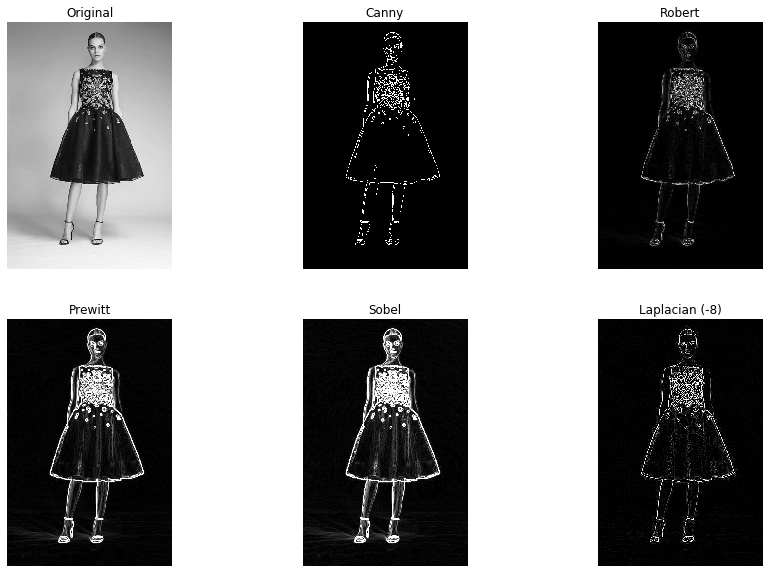

In [45]:
fig1, axes1 = plt.subplots(2,3, figsize = (15,10))

axes1[0][0].imshow(girl_image, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[0][1].imshow(girl_canny, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title('Canny')

axes1[0][2].imshow(girl_robert, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][2].axis('off')
axes1[0][2].set_title('Robert')

axes1[1][0].imshow(girl_prewitt, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title('Prewitt')

axes1[1][1].imshow(girl_sobel, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title('Sobel')

axes1[1][2].imshow(girl_laplacian_8, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title('Laplacian (-8)')

plt.show()

180, 200 seems to be good values for Canny

__Observations:__ Prewitt, Sobel > Canny, Laplacian ~ Robert. Prewitt and Sobel do a much better job and also give continuous and bright edges. Robert also shows good results, if we set the vmax value to a lower value (100-150). Canny is giving rough and broken edges

__4. What will the 5×5 variants of Sobel and Prewitt filters look like? Apply these
larger filters on girl.jpg and make observations upon comparing their outputs
with the corresponding smaller filters.__

__Sobel filter 5 $\times$ 5__
$$
 \mathbf{Gx} = \left[ \begin{array}{rrrrr} -1 & -2 & 0 & 2 & 1\\-2 & -3 & 0 & 3 & 2\\-3 & -5 & 0 & 5 & 3\\-2 & -3 & 0 & 3 & 2\\-1 & -2 & 0 & 2 & 1\end{array}\right]
 \mathbf{Gy} = \left[ \begin{array}{rrrrr} 1 & 2 & 3 & 2 & 1\\2 & 3 & 5 & 3 & 2\\0 & 0 & 0 & 0 & 0\\-2 & -3 & -5 & -3 & -2\\-1 & -2 & -3 & -2 & -1\end{array}\right]
$$ 
<br>reference : https://www.semanticscholar.org/paper/Palmprint-identification-using-Sobel-operator-Wong-Chekima/af1972842bf2c162de09bbadbc44af1cf3ce664f/figure/3
<br>
__Prewitt filter 5 $\times$ 5__
$$
 \mathbf{Gx} = \left[ \begin{array}{rrrrr} -2 & -1 & 0 & 1 & 2\\-2 & -1 & 0 & 1 & 2\\-2 & -1 & 0 & 1 & 2\\-2 & -1 & 0 & 1 & 2\\-2 & -1 & 0 & 1 & 2\end{array}\right]
 \mathbf{Gy} = \left[ \begin{array}{rrrrr} 2 & 2 & 2 & 2 & 2\\1 & 1 & 1 & 1 & 1\\0 & 0 & 0 & 0 & 0\\-1 & -1 & -1 & -1 & -1\\-2 & -2 & -2 & -2 & -2\end{array}\right]
$$
reference : https://www.semanticscholar.org/paper/Image-Segmentation-using-Extended-Edge-Operator-for-Kekre-Gharge/bd02f5166b23483285d935f6ad5f7d8c1c0ccb90

In [46]:
def prewitt_filter_5(img, direction, zero_padding = 0):
    if (direction == Gradient_Direction.x):
        Mx = np.array([[-2, -1, 0, 1, 2],
                       [-2, -1, 0, 1, 2],
                       [-2, -1, 0, 1, 2],
                       [-2, -1, 0, 1, 2],
                       [-2, -1, 0, 1, 2]])
        return apply_kernel(img, Mx, zero_padding)
    
    if (direction == Gradient_Direction.y):
        My = np.array([[2, 2, 2, 2, 2],
                       [1, 1, 1, 1, 1],
                       [0, 0, 0, 0, 0],
                       [-1,-1,-1,-1,-1],
                       [-2,-2,-2,-2,-2]])
        return apply_kernel(img, My, zero_padding)
    
    Mx = np.array([[-2, -1, 0, 1, 2],
                   [-2, -1, 0, 1, 2],
                   [-2, -1, 0, 1, 2],
                   [-2, -1, 0, 1, 2],
                   [-2, -1, 0, 1, 2]])
    
    My = np.array([[2, 2, 2, 2, 2],
                   [1, 1, 1, 1, 1],
                   [0, 0, 0, 0, 0],
                   [-1,-1,-1,-1,-1],
                   [-2,-2,-2,-2,-2]])
    
    return np.sqrt(apply_kernel(img, Mx, zero_padding) ** 2 + apply_kernel(img, My, zero_padding) ** 2).astype(int)

In [47]:
def sobel_filter_5(img, direction:Gradient_Direction, zero_padding = 0):
    if (direction == Gradient_Direction.x):
        Mx = np.array([[-1, -2, 0, 2, 1],
                       [-2, -3, 0, 3, 2],
                       [-3, -5, 0, 5, 3],
                       [-2, -3, 0, 3, 2],
                       [-1, -2, 0, 2, 1]])
        return apply_kernel(img, Mx, zero_padding)
    
    if (direction == Gradient_Direction.y):
        My = np.array([[1, 2, 3, 2, 1],
                       [2, 3, 5, 3, 2],
                       [0, 0, 0, 0, 0],
                       [-2,-3,-5,-3,-2],
                       [-1,-2,-3,-2,-1]])
        return apply_kernel(img, My, zero_padding)
    
    Mx = np.array([[-1, -2, 0, 2, 1],
                   [-2, -3, 0, 3, 2],
                   [-3, -5, 0, 5, 3],
                   [-2, -3, 0, 3, 2],
                   [-1, -2, 0, 2, 1]])
    
    My = np.array([[1, 2, 3, 2, 1],
                   [2, 3, 5, 3, 2],
                   [0, 0, 0, 0, 0],
                   [-2,-3,-5,-3,-2],
                   [-1,-2,-3,-2,-1]])
    
    return np.sqrt(apply_kernel(img, Mx, zero_padding) ** 2 + apply_kernel(img, My, zero_padding) ** 2).astype(int)

In [48]:
girl_sobel_5 = sobel_filter_5(girl_image, Gradient_Direction.xy)
# showImage(girl_sobel_5)

In [49]:
girl_prewitt_5 = prewitt_filter_5(girl_image, Gradient_Direction.xy)
# showImage(girl_prewitt_5)

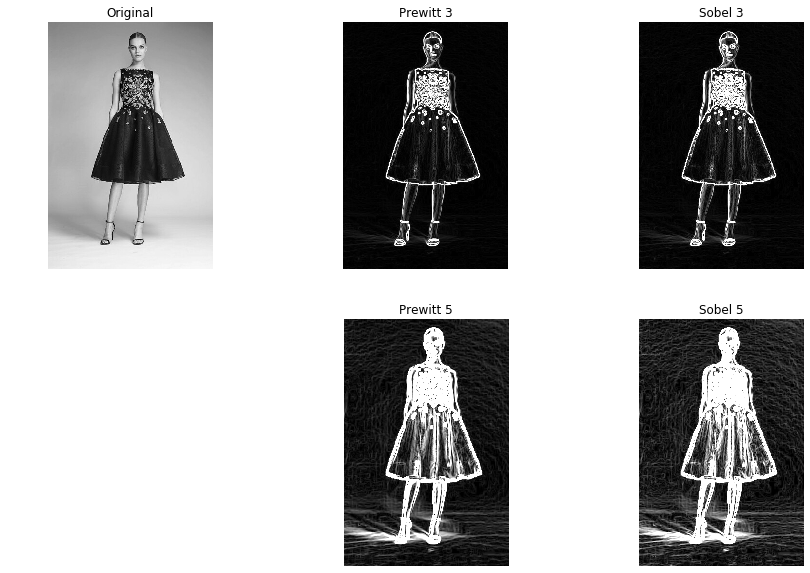

In [50]:
fig1, axes1 = plt.subplots(2,3, figsize = (15,10))

axes1[0][0].imshow(girl_image, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[1][0].axis('off')

axes1[0][1].imshow(girl_prewitt, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title('Prewitt 3')

axes1[0][2].imshow(girl_sobel, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][2].axis('off')
axes1[0][2].set_title('Sobel 3')

axes1[1][1].imshow(girl_prewitt_5, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title('Prewitt 5')

axes1[1][2].imshow(girl_sobel_5, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title('Sobel 5')

plt.show()

__Observations:__ The 5 by 5 sized kernels for both Prewitt and Sobel give much brighter and thicker (amplified) edges and also detect very low gradient edges, as can be seen in the background. Sobel 5 is brighter and more sensitive to small gradient changes than Prewitt 5.

__5. Zero-mean gaussian noise with σ = 10 and σ = 30 has been added to girl.jpg to
obtain girlNoisy1.jpg and girlNoisy2.jpg, respectively. Study the effect of applying the above filters (from 2nd Question) on the noise-
affected inputs.__

In [51]:
girlNoisy1 = readImageAsGray("girlNoisy1.jpg")

In [52]:
girl_canny = cv2.Canny(girlNoisy1, 255, 255)

In [53]:
girl_robert = robert_filter(girlNoisy1, Gradient_Direction.xy)

In [54]:
girl_prewitt = prewitt_filter(girlNoisy1, Gradient_Direction.xy)

In [55]:
girl_sobel = sobel_filter(girlNoisy1, Gradient_Direction.xy)

In [56]:
girl_laplacian_8 = laplacian_filter(girlNoisy1, -8)

In [57]:
girl_prewitt_5 = prewitt_filter_5(girlNoisy1, Gradient_Direction.xy)

In [58]:
girl_sobel_5 = sobel_filter_5(girlNoisy1, Gradient_Direction.xy)

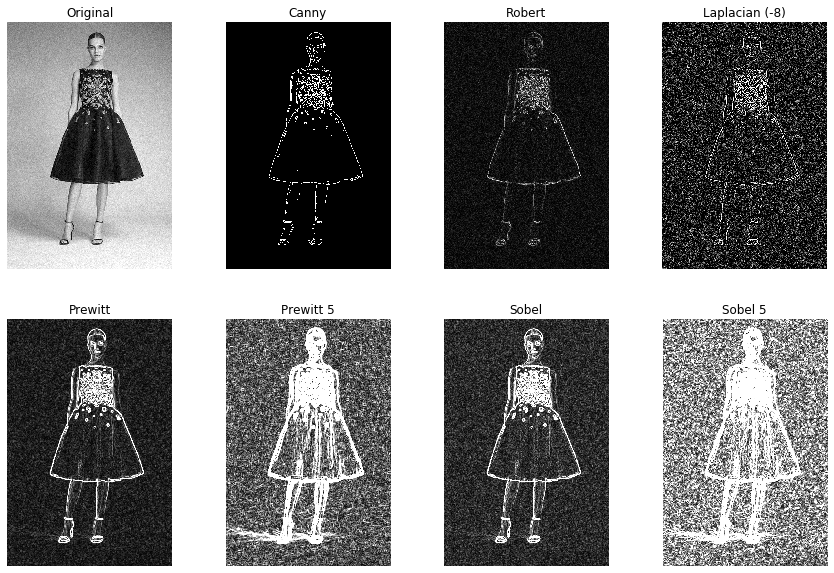

In [59]:
fig1, axes1 = plt.subplots(2,4, figsize = (15,10))

axes1[0][0].imshow(girlNoisy1, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[0][1].imshow(girl_canny, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title('Canny')

axes1[0][2].imshow(girl_robert, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][2].axis('off')
axes1[0][2].set_title('Robert')

axes1[0][3].imshow(girl_laplacian_8, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][3].axis('off')
axes1[0][3].set_title('Laplacian (-8)')

axes1[1][0].imshow(girl_prewitt, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title('Prewitt')

axes1[1][1].imshow(girl_prewitt_5, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title('Prewitt 5')

axes1[1][2].imshow(girl_sobel, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title('Sobel')

axes1[1][3].imshow(girl_sobel_5, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][3].axis('off')
axes1[1][3].set_title('Sobel 5')

plt.show()

__Observations:__ Canny is unaffected by low sigma noise, and Robert, Prewitt 3 by 3 and Sobel 3 by 3 do a decent job too, although there is noise in the output, whereas Prewitt 5 by 5, Sobel 5 by 5 are affected a lot by the noise. They still produce the edges but with a lot of noise in the background, and hence extracting the edges might become difficukt.

In [60]:
girlNoisy2 = readImageAsGray("girlNoisy2.jpg")

In [61]:
girl_canny = cv2.Canny(girlNoisy2, 255, 255)

In [62]:
girl_robert = robert_filter(girlNoisy2, Gradient_Direction.xy)

In [63]:
girl_prewitt = prewitt_filter(girlNoisy2, Gradient_Direction.xy)

In [64]:
girl_sobel = sobel_filter(girlNoisy2, Gradient_Direction.xy)

In [65]:
girl_laplacian_8 = laplacian_filter(girlNoisy2, -8)

In [66]:
girl_prewitt_5 = prewitt_filter_5(girlNoisy2, Gradient_Direction.xy)

In [67]:
girl_sobel_5 = sobel_filter_5(girlNoisy2, Gradient_Direction.xy)

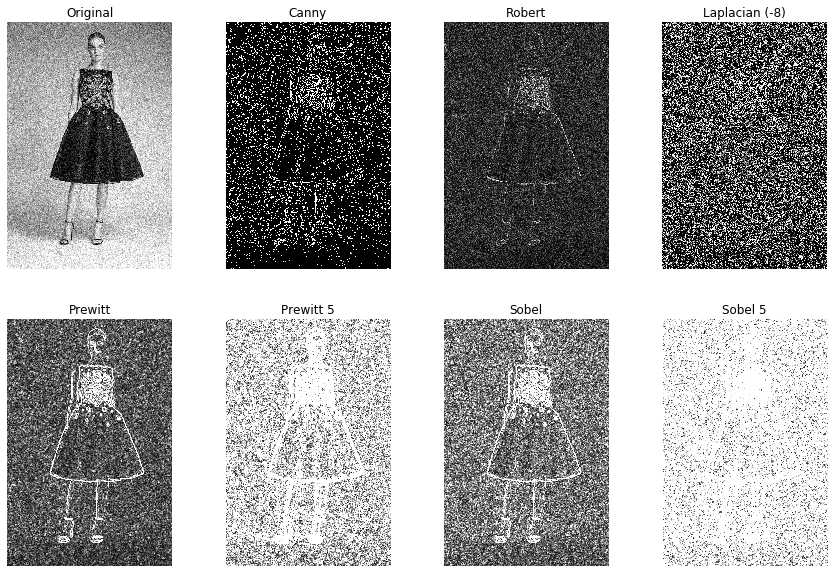

In [68]:
fig1, axes1 = plt.subplots(2,4, figsize = (15,10))

axes1[0][0].imshow(girlNoisy2, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[0][1].imshow(girl_canny, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title('Canny')

axes1[0][2].imshow(girl_robert, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][2].axis('off')
axes1[0][2].set_title('Robert')

axes1[0][3].imshow(girl_laplacian_8, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][3].axis('off')
axes1[0][3].set_title('Laplacian (-8)')

axes1[1][0].imshow(girl_prewitt, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title('Prewitt')

axes1[1][1].imshow(girl_prewitt_5, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title('Prewitt 5')

axes1[1][2].imshow(girl_sobel, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title('Sobel')

axes1[1][3].imshow(girl_sobel_5, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][3].axis('off')
axes1[1][3].set_title('Sobel 5')

plt.show()

__Observations:__ High sigma gaussian noise is affecting all the filters, but Prewitt 3, Sobel 3 and Robert are still managing to find the edges, with noise. Whereas, all the other filters have been affected badly and produce outputs which probably cannot be used, especially Laplacian, we can still see a bad outline for others.

---

## 3. Gaussian Filtering and Bilateral Filtering

__1. Implement Gaussian filter and apply it to mountain.png. Vary σ value for filter
size, 5x5. Find the optimal σ value for k=5 and compare the obtained outputs.
Now vary the filter sizes (take optimal σ value for each filter size) and report your
observations along with the images.
Note: Optimal filter size for a given σ is the one that snugly fits 99% of the gaussian
curve__

In [69]:
def gaussian(x, sigma):
    return np.exp(-np.square(x) / np.square(sigma) / 2) / np.sqrt(2 * np.pi) / sigma
    
def gaussian_kernel(k, sigma, normalize_to_1 = True):
    x_dir = np.linspace(-(k-1)/2, (k-1)/2, k)
    gauss_1d = gaussian(x_dir, sigma)
#     print(x_dir, gauss_1d)
    kernel = np.outer(gauss_1d, gauss_1d)
    if normalize_to_1:
        kernel = kernel / np.sum(kernel)
    return kernel

def gaussian_filter(img, k, sigma, zero_padding = 0):
    filter_ = gaussian_kernel(k, sigma, True)
    return apply_kernel(img, filter_, zero_padding)

In [70]:
np.sum(gaussian_kernel(5, 0.934, False))

0.9900211920885539

Optimal sigma for 5x5 gaussian kernal ~ 0.934

In [71]:
np.sum(gaussian_kernel(7, 1, False))

0.9994587918263369

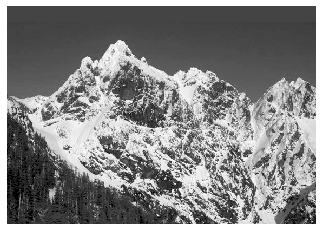

In [72]:
mountain_img = readImageAsGray("mountain.png")
showImage(mountain_img)

In [73]:
mountain_gaussian = gaussian_filter(mountain_img, 5, 0.93421)

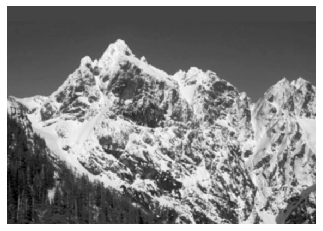

In [74]:
showImage(mountain_gaussian)

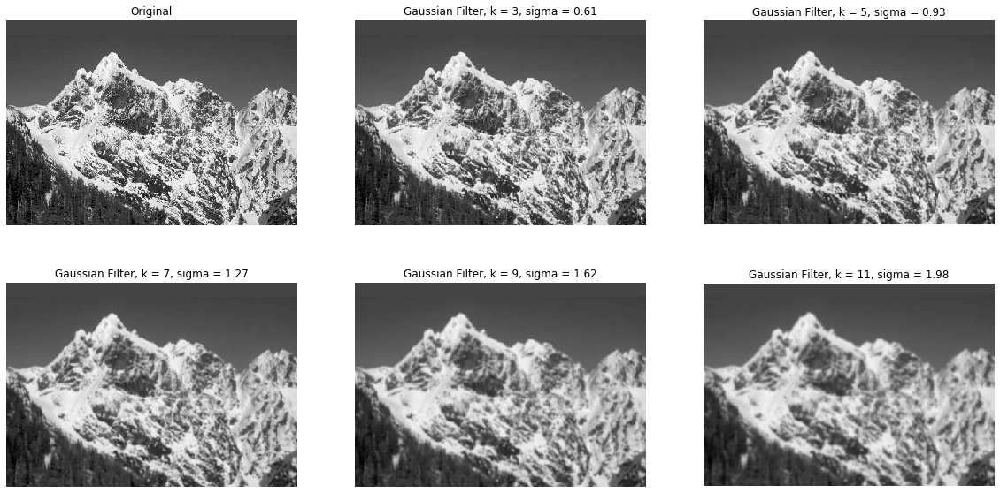

In [75]:
fig1, axes1 = plt.subplots(2,3, figsize = (20,10))

axes1[0][0].imshow(mountain_img, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

k, sigma = 3, 0.61
mountain_gaussian = gaussian_filter(mountain_img, k, sigma)
axes1[0][1].imshow(mountain_gaussian, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title(f"Gaussian Filter, k = {k}, sigma = {sigma}")

k, sigma = 5, 0.93
mountain_gaussian = gaussian_filter(mountain_img, k, sigma)
axes1[0][2].imshow(mountain_gaussian, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][2].axis('off')
axes1[0][2].set_title(f"Gaussian Filter, k = {k}, sigma = {sigma}")

k, sigma = 7, 1.27
mountain_gaussian = gaussian_filter(mountain_img, k, sigma)
axes1[1][0].imshow(mountain_gaussian, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title(f"Gaussian Filter, k = {k}, sigma = {sigma}")

k, sigma = 9, 1.62
mountain_gaussian = gaussian_filter(mountain_img, k, sigma)
axes1[1][1].imshow(mountain_gaussian, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title(f"Gaussian Filter, k = {k}, sigma = {sigma}")

k, sigma = 11, 1.98
mountain_gaussian = gaussian_filter(mountain_img, k, sigma)
axes1[1][2].imshow(mountain_gaussian, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title(f"Gaussian Filter, k = {k}, sigma = {sigma}")

plt.show()

__2. Implement bilateral filtering and apply it to mountain.png.__

In [76]:
def bilateral_filter_channel(img, k, space_s, range_s, zero_padding = 0):
    in_img = np.zeros((img.shape[0] + 2 * zero_padding, img.shape[1] + 2 * zero_padding), int)
    in_img[zero_padding : in_img.shape[0] - zero_padding, zero_padding : in_img.shape[1] - zero_padding] = img
    
    new_h, new_w = in_img.shape[0] - k + 1, in_img.shape[1] - k + 1
    new_img = np.zeros((new_h, new_w), int)
    
    negative_range = k//2
    positive_range = k // 2 if k % 2 != 0 else k//2 - 1
    
    exp_s_const = -0.5 / space_s**2
    exp_r_const = -0.5 / range_s**2
    
    space_weights = np.zeros((k, k))
    for x in range(-negative_range, positive_range + 1):
        for y in range(-negative_range, positive_range + 1):
            space_weights[x + negative_range, y + negative_range] = np.exp(exp_s_const * (x**2 + y**2))
    
    for i in range(negative_range, in_img.shape[0] - positive_range):
        for j in range(negative_range, in_img.shape[1] - positive_range):
            pixel_val = 0
            normalisation = 0
            
            kernal_img = in_img[i - negative_range : i + positive_range + 1, j - negative_range : j + positive_range + 1]
            range_weights = np.exp(exp_r_const * np.abs(kernal_img - in_img[i,j]))
            
            common_kernel = space_weights * range_weights
            pixel_val = np.sum(common_kernel * kernal_img)
            normalisation = np.sum(common_kernel)
                    
            new_img[i-negative_range, j-negative_range] = np.round(pixel_val / normalisation)
    
    return new_img

In [77]:
def bilateral_filter(img, k, space_s, range_s, zero_padding = 0):
    if len(img.shape) == 2:
        return bilateral_filter_channel(img, k, space_s, range_s, zero_padding = 0)
    
    new_h, new_w = img.shape[0] - k + 2 * zero_padding  + 1, img.shape[1] - k + 2 * zero_padding + 1
    new_img = np.zeros((new_h, new_w, img.shape[2]), int)
    
    for c in range(img.shape[2]):
        new_img[:,:,c] = bilateral_filter_channel(img[:,:,c], k, space_s, range_s, zero_padding)
    return new_img

In [78]:
mountain_bilateral = bilateral_filter(mountain_img, 11, 10, 5)

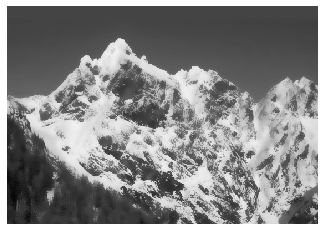

In [79]:
showImage(mountain_bilateral)

__3. Vary the effect of domain and range components of the bilateral filter and report
your observations along with the images.__

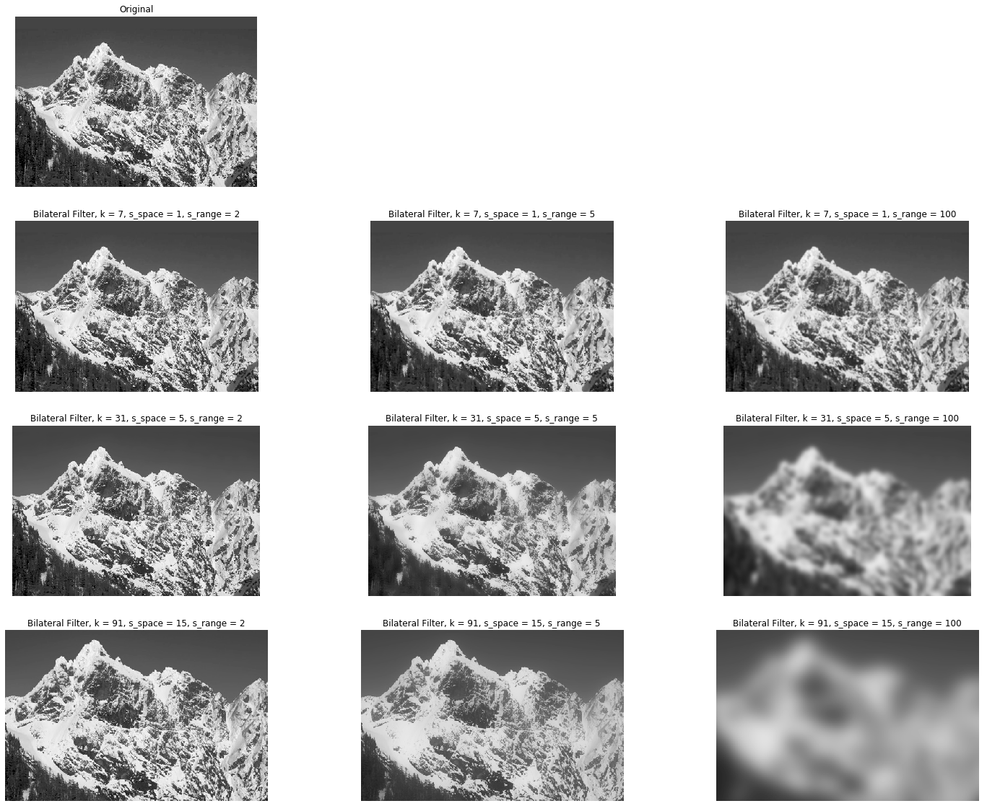

In [80]:
fig1, axes1 = plt.subplots(4, 3, figsize = (25, 20))

axes1[0][0].imshow(mountain_img, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[0][1].axis('off')

axes1[0][2].axis('off')

k, s_s, s_r = 7, 1, 2
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[1][0].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 7, 1, 5
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[1][1].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 7, 1, 100
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[1][2].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 31, 5, 2
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[2][0].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[2][0].axis('off')
axes1[2][0].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 31, 5, 5
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[2][1].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[2][1].axis('off')
axes1[2][1].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 31, 5, 100
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[2][2].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[2][2].axis('off')
axes1[2][2].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 91, 15, 2
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[3][0].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[3][0].axis('off')
axes1[3][0].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 91, 15, 5
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[3][1].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[3][1].axis('off')
axes1[3][1].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

k, s_s, s_r = 91, 15, 100
mountain_bilateral = bilateral_filter(mountain_img, k, s_s, s_r)
axes1[3][2].imshow(mountain_bilateral, cmap = "gray", vmin = 0, vmax = 255)
axes1[3][2].axis('off')
axes1[3][2].set_title(f"Bilateral Filter, k = {k}, s_space = {s_s}, s_range = {s_r}")

plt.show()

__Observations:__ When we increase the $\sigma_{space}$ value, we can see that the blurring in the image, but edges being preserved. But the higher the value of $\sigma_{range}$, the more the image becomes only Gaussian filtering and hecne edges are no longer preserved.

---

## 4. Rain removal

__1. Apply gaussian filter on rain.png. Report the σ value and filter size for the best
output.__

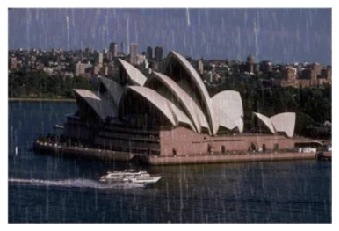

In [81]:
rain_img = readRgbImage("rain.png")
showImage(rain_img)

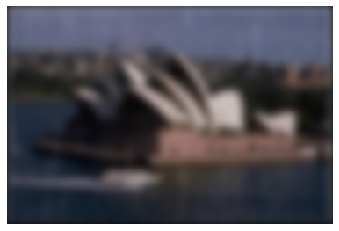

In [82]:
# rain_gaussian = gaussian_filter(rain_img, 20, 4)

rain_gaussian = np.copy(rain_img)
k, s = 21, 5
p = k//2
rain_gaussian[:,:,0] = gaussian_filter(rain_img[:,:,0], k, s, p)
rain_gaussian[:,:,1] = gaussian_filter(rain_img[:,:,1], k, s, p)
rain_gaussian[:,:,2] = gaussian_filter(rain_img[:,:,2], k, s, p)

showImage(rain_gaussian)

k, sigma = 21, 5 give a good rain less output for gaussian filter

In [83]:
# showImage(median_filter(rain_img[:,:,0],11,5))

In [84]:
# showImage(median_filter(rain_img[:,:,1],9,4))

In [85]:
# showImage(median_filter(rain_img[:,:,2],9,4))

__2. Apply median filter on rain.png. Report the filter size for the best output.__

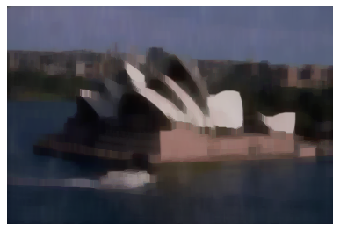

In [86]:
rain_median = np.copy(rain_img)
k = 15
p = k // 2

rain_median[:,:,0] = efficient_median_filter(rain_img[:,:,0], k, p)
rain_median[:,:,1] = efficient_median_filter(rain_img[:,:,1], k, p)
rain_median[:,:,2] = efficient_median_filter(rain_img[:,:,2], k, p)

showImage(rain_median)

K = 15 gives a good rain less image for median filter

__3. Apply bilateral filter on rain.png. Report the σ values(domain and range components) and filter size for the best output.__

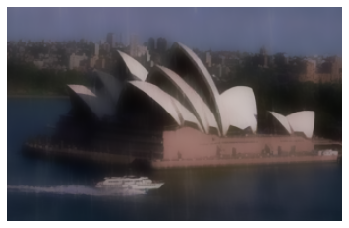

In [87]:
# rain_bilateral = np.copy(rain_img)

k, s, r = 31, 6, 6
rain_bilateral = bilateral_filter(rain_img, k, s, r)

showImage(rain_bilateral)

Best values: k = 31, $\sigma_{space}$ = 6, , $\sigma_{range}$ = 6

__4. Compare the outputs from the above three filters and report your observations.
Feel free to try out any other methods to achieve the intended result.
<br>Note: The best output is one where the rain drops are minimally visible without
affecting the rest of the scene or introducing new artifacts into the scene.__

__Observations:__ Bilateral Filter gives the best output, as there is blurring but the edges have been preserved, hence the objects in the image are still recognizable. Whereas, Gaussian Filter has done overall blurring to the image and hence the objects have started blending in together, but it still looks smoother than the output from Median filter, which looks a little pixelated as the edges have blended a lot, although it might still please some people, as the boat is better visible after median than gaussian.

---

## 5. Cartoon Creation

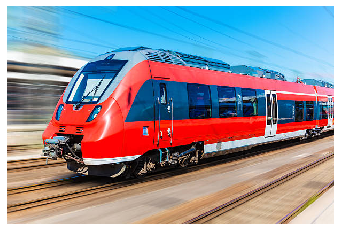

In [88]:
train_img = readRgbImage("train.jpg")
showImage(train_img)

__1. Apply the bilateral filtering to the color image. Keep this filtered image aside for
the last step.__

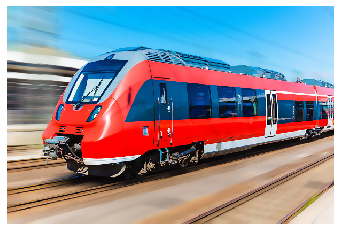

In [89]:
train_bilateral = bilateral_filter(train_img, 11, 7, 3, 5)
showImage(train_bilateral)

__2. Now, take a copy of original color image, convert it to gray scale.__

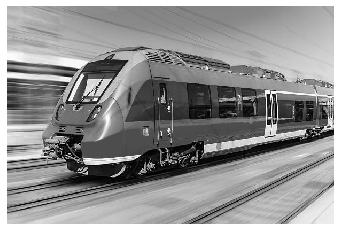

In [90]:
train_gray = cv2.cvtColor(train_img, cv2.COLOR_RGB2GRAY)
showImage(train_gray)

__3. Apply blurring on this gray scale image to reduce noise. [You can try different variants of blurring(box filter, gaussian filter, repeated gaussian filter,..) with
different filter sizes and see the performance]__

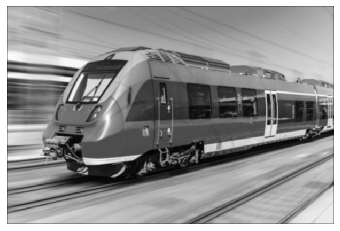

In [91]:
train_gaussian = gaussian_filter(train_gray, 7, 1, 3).astype('uint8')
showImage(train_gaussian)
# train_gaussian.shape

__4. Now, create an edge mask from this blurred, gray scale image. An edge mask can
be obtained using adaptive thresholding.
[You can also try obtaining the edge mask by pixel wise division of the grayscale
image by the blurred image (of the edges) to generate an outline similar to pencil
sketches.]__

In [92]:
def adaptiveThreshold(img, maxValue, type_, k, c):
    if type_ == cv2.ADAPTIVE_THRESH_MEAN_C:
        kernel = np.ones((k, k)) / (k**2)
    elif type_ == cv2.ADAPTIVE_THRESH_GAUSSIAN_C:
        kernel = gaussian_kernel(k, (k - 1) / 6)
    
    zero_padding = k//2
    in_img = np.zeros((img.shape[0] + 2 * zero_padding, img.shape[1] + 2 * zero_padding), int)
    in_img[zero_padding : in_img.shape[0] - zero_padding, zero_padding : in_img.shape[1] - zero_padding] = img
    
    new_h, new_w = in_img.shape[0] - kernel.shape[0] + 1, in_img.shape[1] - kernel.shape[1] + 1
    new_img = np.zeros((new_h, new_w), int)
    
    for i in range(new_h):
        for j in range(new_w):
            if np.round(np.sum(in_img[i:i + k, j:j + k] * kernel)) - c < img[i][j]:
                new_img[i][j] = maxValue
            else:
                new_img[i][j] = 0
    return new_img


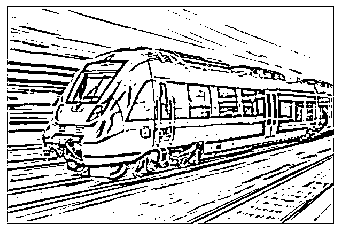

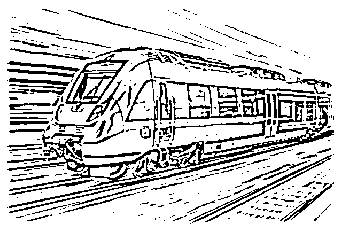

In [93]:
mask = cv2.adaptiveThreshold(train_gaussian, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 6)
showImage(mask)
# print(mask)
# mask.shape

mask = adaptiveThreshold(train_gaussian, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 11, 6)
showImage(mask)
# print(mask)
# mask.shape

c:\users\laksh\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
c:\users\laksh\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


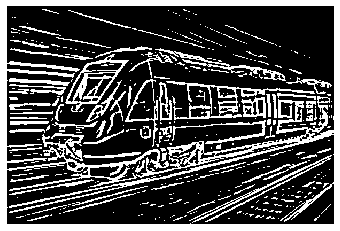

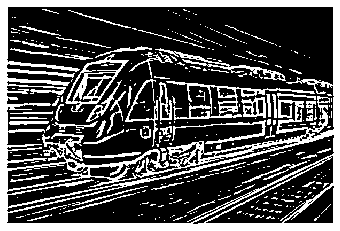

In [94]:
sketch = np.divide(train_gray, mask)
# sketch[sketch > 255] = 255
# showImage(255 - sketch)
showImage(sketch)
# print(sketch)

sketch = cv2.adaptiveThreshold(train_gaussian, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 6)
showImage(sketch)

__5. Combine the bilateral filtered image from step 1 with edge mask(by taking bitwise
AND of both at each pixel location).__

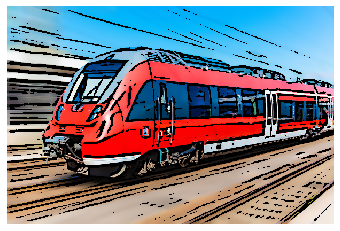

In [95]:
train_cartoon = np.copy(train_bilateral)
for c in range(3):
    train_cartoon[:,:,c] = np.bitwise_and(train_cartoon[:,:,c], mask)
showImage(train_cartoon)

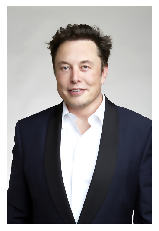

In [96]:
musk_img = readRgbImage("musk.jpg")
musk_bilateral = bilateral_filter(musk_img, 9, 9, 3, 4)
showImage(musk_bilateral)

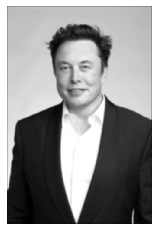

In [97]:
musk_gray = cv2.cvtColor(musk_img, cv2.COLOR_RGB2GRAY)
musk_gaussian = gaussian_filter(musk_gray, 9, 2, 4).astype('uint8')
showImage(musk_gaussian)

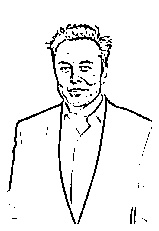

c:\users\laksh\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
c:\users\laksh\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


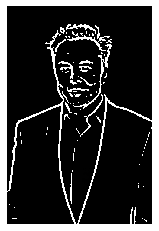

In [98]:
mask_musk = cv2.adaptiveThreshold(musk_gaussian, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 5)
showImage(mask_musk)

sketch_musk = np.divide(musk_gray, mask_musk)
showImage(sketch_musk)

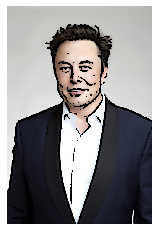

In [99]:
musk_cartoon = np.copy(musk_bilateral)
for c in range(3):
    musk_cartoon[:,:,c] = np.bitwise_and(musk_cartoon[:,:,c], mask_musk)
showImage(musk_cartoon)

---

## 6. Unsharp Masking and Highboost filtering

__1. Implement Unsharp Masking and apply it to orion.jpg.__

In [100]:
def unsharp_masking(img, k, sigma):
    zero_padding = k // 2
    mask = img - gaussian_filter(img, k, sigma, zero_padding)
    return (img + mask)

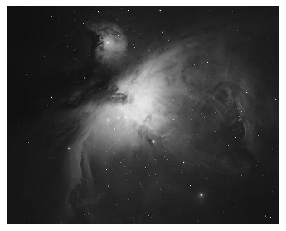

In [101]:
orion_img = readImageAsGray("orion.jpg")
showImage(orion_img)

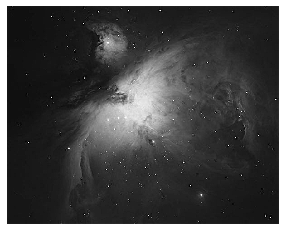

In [102]:
orion_unsharp = unsharp_masking(orion_img, 13, 2)
showImage(orion_unsharp)

__Observations:__ Image has become sharper. More stars are visible now.

__2. Implement Highboost Filtering and apply it to orion.jpg. Increase the coefficient
values for the edge mask and report your observations.
(Take the same filter size as in unsharp Masking.)__

In [103]:
def highboost_filtering(img, k, sigma, lambda_):
    zero_padding = k // 2
    mask = img - gaussian_filter(img, k, sigma, zero_padding)
    return (img + lambda_ * mask)

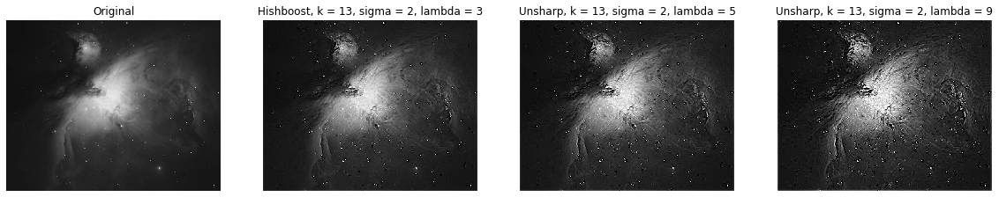

In [104]:
orion_highboost = highboost_filtering(orion_img, 13, 2, 5)

fig1, axes1 = plt.subplots(1,4, figsize = (20,15))

axes1[0].imshow(orion_img, cmap = "gray", vmin = 0, vmax = 255)
axes1[0].axis('off')
axes1[0].set_title("Original")

k, sigma = 13, 2
lambda_ = 3
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[1].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[1].axis('off')
axes1[1].set_title(f"Hishboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

lambda_ = 5
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[2].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[2].axis('off')
axes1[2].set_title(f"Unsharp, k = {k}, sigma = {sigma}, lambda = {lambda_}")

lambda_ = 9
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[3].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[3].axis('off')
axes1[3].set_title(f"Unsharp, k = {k}, sigma = {sigma}, lambda = {lambda_}")

plt.show()

__Observations:__ As the coefficient value of edge mask ($\lambda$) increases, the sharpness of the image increases and the smoothness decreases. We can see more and more stars by increasing $\lambda$ which were dull or not visible in the original image.

__3. Choose any three different filter sizes. Compare the two methods for each filter size
and report your observations along with the images.__

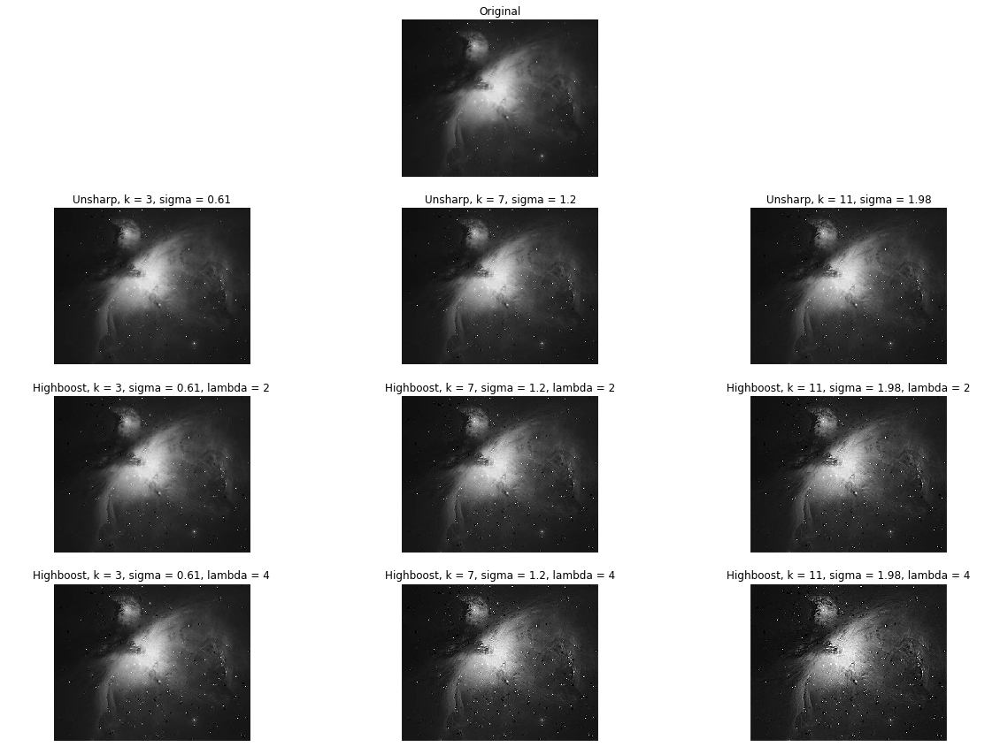

In [105]:
fig1, axes1 = plt.subplots(4,3, figsize = (20,15))

axes1[0][1].imshow(orion_img, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title('Original')

axes1[0][0].axis('off')

axes1[0][2].axis('off')

k, sigma = 3, 0.61
orion_unsharp = unsharp_masking(orion_img, k, sigma)
axes1[1][0].imshow(orion_unsharp, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title(f"Unsharp, k = {k}, sigma = {sigma}")

k, sigma = 7, 1.2
orion_unsharp = unsharp_masking(orion_img, k, sigma)
axes1[1][1].imshow(orion_unsharp, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title(f"Unsharp, k = {k}, sigma = {sigma}")

k, sigma = 11, 1.98
orion_unsharp = unsharp_masking(orion_img, k, sigma)
axes1[1][2].imshow(orion_unsharp, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][2].axis('off')
axes1[1][2].set_title(f"Unsharp, k = {k}, sigma = {sigma}")

lambda_ = 2
k, sigma = 3, 0.61
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[2][0].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[2][0].axis('off')
axes1[2][0].set_title(f"Highboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

k, sigma = 7, 1.2
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[2][1].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[2][1].axis('off')
axes1[2][1].set_title(f"Highboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

k, sigma = 11, 1.98
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[2][2].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[2][2].axis('off')
axes1[2][2].set_title(f"Highboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

lambda_ = 4
k, sigma = 3, 0.61
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[3][0].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[3][0].axis('off')
axes1[3][0].set_title(f"Highboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

k, sigma = 7, 1.2
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[3][1].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[3][1].axis('off')
axes1[3][1].set_title(f"Highboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

k, sigma = 11, 1.98
orion_highboost = highboost_filtering(orion_img, k, sigma, lambda_)
axes1[3][2].imshow(orion_highboost, cmap = "gray", vmin = 0, vmax = 255)
axes1[3][2].axis('off')
axes1[3][2].set_title(f"Highboost, k = {k}, sigma = {sigma}, lambda = {lambda_}")

plt.show()

__Observations:__ As the filter size increases, we start to see the hidden details more and more using either of unsharp or highboost, .ie, image sharpness increases. And this also results in reduction of image smoothness, which can be observed for higher $\lambda$ values

---

## 7. Fourier Transform

In [116]:
import cmath

__1. Implement 2D DFT.__

In [117]:
def dft_2d(img):
    M, N = img.shape[0], img.shape[1]
    pi_2 = 2*np.pi
    
    dft_image = np.zeros((M,N), dtype = complex)
    
    for m in range(M):
        for n in range(N):
            pixel_val = 0
            for x in range(M):
                for y in range(N):
                    exp_term =  cmath.exp((-1j) * pi_2 * (m * x / M + n * y / N))
                    pixel_val += img[x,y] * exp_term
            dft_image[m,n] = pixel_val
            
    return dft_image

In [118]:
def center_shift_2d(img):
    return np.fft.fftshift(img)

def inverse_center_shift_2d(img):
    return np.fft.ifftshift(img)

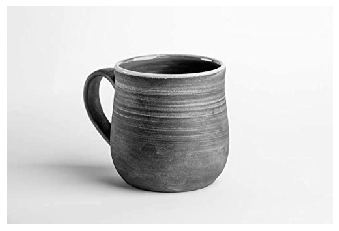

In [119]:
cup_img = readImageAsGray("cup.jpg")
showImage(cup_img)

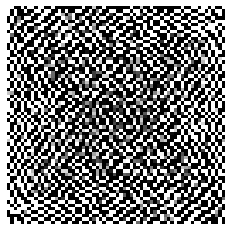

In [120]:
dft_cup = dft_2d(cv2.resize(cup_img, (64, 64)))
showImage(dft_cup.real)

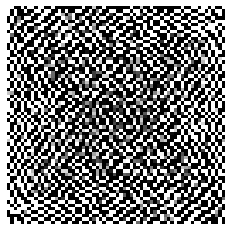

In [121]:
fft_cup = np.fft.fft2(cv2.resize(cup_img, (64,64)))
showImage(fft_cup.real)

In [122]:
np.allclose(dft_cup, fft_cup)

True

__2. Implement 1D FFT. Use it to implement 2D FFT and display the result on suitable
images of your choice.
<br>Compare the runtimes of your version of DFT and FFT on different sized images
(as in Q1) and plot them.__

In [123]:
def fft_1d(array_1d):
    N = array_1d.shape[0]
    assert np.log2(N) % 1 == 0, "Image dimension should be power of 2"
    
    if N == 1:
        return np.array([cmath.exp((-1j) * 2 * np.pi) * array_1d[0]])
    
    fft_even = fft_1d(array_1d[::2])
    fft_odd = fft_1d(array_1d[1::2])
    
    exp_terms = np.exp(-2j * np.pi * np.arange(N) / N)
    fft_out = np.concatenate([fft_even + exp_terms[:N//2] * fft_odd, fft_even + exp_terms[N//2:] * fft_odd])
    return fft_out

In [124]:
fft1 = fft_1d(np.arange(16))
# print(fft1)
fft1_np = np.fft.fft(np.arange(16))
# print(fft1_np)
print(np.allclose(fft1, fft1_np))

True


In [125]:
def fft_2d(img):
    M, N = img.shape[0], img.shape[1]
    
    fft_out = np.zeros((M,N), complex)
    for m in range(M):
        fft_out[m] = fft_1d(img[m])
    
    for n in range(N):
        fft_out[:, n] = fft_1d(fft_out[:, n])
        
    return fft_out

In [126]:
array_2d = np.random.rand(32, 16)
fft2 = fft_2d(array_2d)
# print(fft2)
fft2_np = np.fft.fft2(array_2d)
# print(fft2_np)
print(np.allclose(fft2, fft2_np))

True


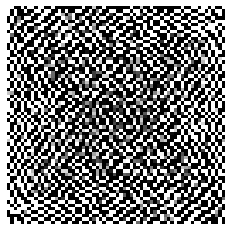

True

In [127]:
fft_cup = fft_2d(cv2.resize(cup_img, (64, 64)))
showImage(fft_cup.real)
np.allclose(fft_cup, np.fft.fft2(cv2.resize(cup_img, (64,64))))

In [175]:
img_size = 4
x_all = []
time_dft = []
time_fft = []

for _ in range(5):
    cup_img_temp = cv2.resize(cup_img, (img_size, img_size))
    x_all.append(img_size)
    start = time.time()
    dft_2d(cup_img_temp)
    end = time.time()
    time_dft.append(end - start)
    
    start = time.time()
    fft_2d(cup_img_temp)
    end = time.time()
    time_fft.append(end - start)
    
    img_size *= 2

In [176]:
time_dft

[0.0009212493896484375,
 0.013918399810791016,
 0.3025627136230469,
 4.470232963562012,
 66.0072340965271]

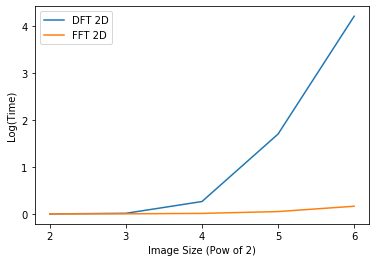

In [177]:
time_dft1 = np.log(1 + np.array(time_dft))
time_fft1 = np.log(1 + np.array(time_fft))
x_all_log = np.arange(2, 7)
plt.plot(x_all_log, time_dft1, label = "DFT 2D")
plt.plot(x_all_log, time_fft1, label = "FFT 2D")
plt.xlabel("Image Size (Pow of 2)")
plt.ylabel("Log(Time)")
plt.xticks(x_all_log)
plt.legend()
plt.show()

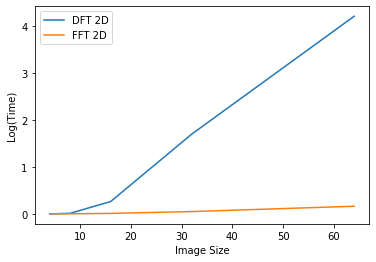

In [178]:
time_dft1 = np.log(1 + np.array(time_dft))
time_fft1 = np.log(1 + np.array(time_fft))
plt.plot(x_all, time_dft1, label = "DFT 2D")
plt.plot(x_all, time_fft1, label = "FFT 2D")
plt.xlabel("Image Size")
plt.ylabel("Log(Time)")
plt.legend()
plt.show()

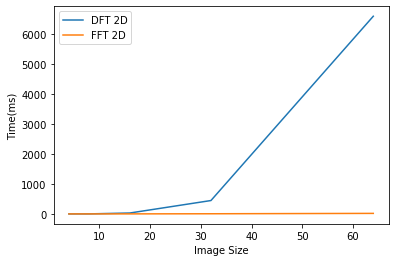

In [179]:
time_dft1 = np.array(time_dft) * 100
time_fft1 = np.array(time_fft) * 100
plt.plot(x_all, time_dft1, label = "DFT 2D")
plt.plot(x_all, time_fft1, label = "FFT 2D")
plt.xlabel("Image Size")
plt.ylabel("Time(ms)")
plt.legend()
plt.show()

__3. Similarly, implement 2D inverse FFT.__

In [128]:
def ifft_1d(array_FT):
    M = array_FT.shape[0]
    array = np.conjugate(array_FT)
    array = fft_1d(array)
    return np.conjugate(array) / M

def ifft_2d(img_ft):
    M, N = img_ft.shape[0], img_ft.shape[1]
    
    img = np.zeros((M,N), complex)
    for m in range(M):
        img[m] = ifft_1d(img_ft[m])
    
    for n in range(N):
        img[:, n] = ifft_1d(img[:, n])
        
    return img

In [124]:
array_2d = np.random.rand(8, 8)
ifft2 = ifft_2d(array_2d)
# print(fft2)
ifft2_np = np.fft.ifft2(array_2d)
# print(fft2_np)
print(np.allclose(ifft2, ifft2_np))

True


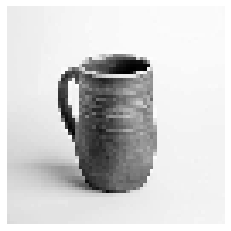

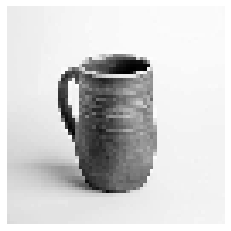

In [125]:
ifft_cup = ifft_2d(fft_cup)
showImage(ifft_cup.real)
showImage(cv2.resize(cup_img,(64,64)))

__4. Calculate the Fourier transform of the Fourier transform of any image. How is it
different from the original image? How can you fix this in the frequency domain so
that we would get the original image back?__

In [126]:
arr_2d = np.arange(20).reshape((5,4))
print(arr_2d)
np.fft.fft2(np.fft.fft2(arr_2d))

[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]
 [12 13 14 15]
 [16 17 18 19]]


array([[  0.+0.j,  60.+0.j,  40.+0.j,  20.+0.j],
       [320.+0.j, 380.+0.j, 360.+0.j, 340.+0.j],
       [240.+0.j, 300.+0.j, 280.+0.j, 260.+0.j],
       [160.+0.j, 220.+0.j, 200.+0.j, 180.+0.j],
       [ 80.+0.j, 140.+0.j, 120.+0.j, 100.+0.j]])

As can be observed from the above, FT of FT gives out an array which is M * N time of the input array with the elements shuffled. (M X N is the shape of input). To remove this effect, we can multiple the output of FT with M * N (ie, multiply by M * N in frequency domain) and then take FT again, as shown below

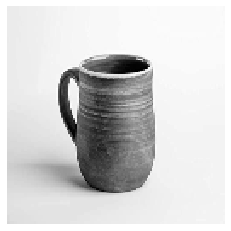

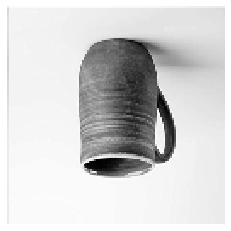

In [127]:
showImage(cv2.resize(cup_img, (128, 128)))
fft_cup = fft_2d(cv2.resize(cup_img, (128, 128)))
# showImage(fft_cup.real)
fft_fft_cup = fft_2d(fft_cup / (fft_cup.shape[0] * fft_cup.shape[1]))
showImage(fft_fft_cup.real)

After doing the above step, we can see that we obtain a 180 degrees ro version of the input image. We can remove this effect by taking the conjugate in the frequency domain.

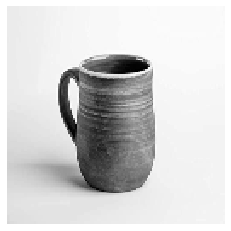

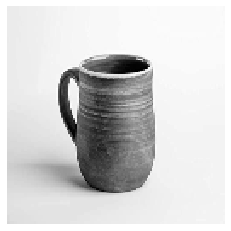

In [128]:
showImage(cv2.resize(cup_img, (128, 128)))
fft_cup = fft_2d(cv2.resize(cup_img, (128, 128)))

fft_fft_cup = fft_2d(np.conjugate(fft_cup / (fft_cup.shape[0] * fft_cup.shape[1])))
showImage(fft_fft_cup.real)

__Ans:__ Therefore we can get the original image back by doing FT of FT, by taking conjugate of the image in frequncy domain and dividing by the pixel count (M * N), these 2 steps can be done in any order.

FT ( conjugate( FT( img ) ) / ( M * N ) ) == img

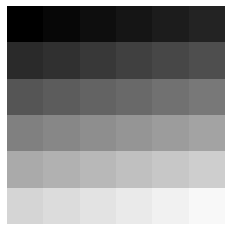

[[ 0  1  2  3  4  5]
 [ 6  7  8  9 10 11]
 [12 13 14 15 16 17]
 [18 19 20 21 22 23]
 [24 25 26 27 28 29]
 [30 31 32 33 34 35]]


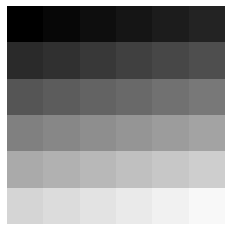

[[ 0.  1.  2.  3.  4.  5.]
 [ 6.  7.  8.  9. 10. 11.]
 [12. 13. 14. 15. 16. 17.]
 [18. 19. 20. 21. 22. 23.]
 [24. 25. 26. 27. 28. 29.]
 [30. 31. 32. 33. 34. 35.]]


In [129]:
arr_2d = np.arange(36).reshape((6,6))
showImage(arr_2d, v_min = 0, v_max = 36)
print(arr_2d)
out = np.fft.fft2(np.conjugate(np.fft.fft2(arr_2d)/ 36)).real
showImage(out, v_min = 0, v_max = 36)
print(out)

---

## 8. Low Pass Filtering using Fourier Transfrom

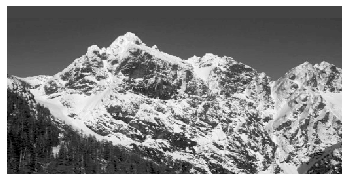

(256, 512)

In [130]:
mountain_img = cv2.resize(readImageAsGray("mountain.png"), (512, 256))
showImage(mountain_img)
mountain_img.shape

__1. Apply ideal lowpass filter of cutoff radius, D = 30 in the frequency domain for
image mountain.png. Also try for D = 15 and 50.
Include the original image and all three ideal lowpass filtered images and briefly
discuss your results.__

In [90]:
def distance_sqr(c1, c2):
    return (c1[0]-c2[0])**2 + (c1[1]-c2[1])**2

def ideal_lowpass_filter(img, D):
    fourier_img = center_shift_2d(fft_2d(img))
    m, n = fourier_img.shape[0], fourier_img.shape[1]
    D_sqr = D**2
    center = ((m-1)/2, (n-1)/2)
    for u in range(m):
        for v in range(n):
            if distance_sqr((u,v), center) > D_sqr:
                fourier_img[u,v] = 0
    return ifft_2d(inverse_center_shift_2d(fourier_img))

In [132]:
mountain_lowpass_15 = ideal_lowpass_filter(mountain_img, 15)
mountain_lowpass_30 = ideal_lowpass_filter(mountain_img, 30)
mountain_lowpass_50 = ideal_lowpass_filter(mountain_img, 50)

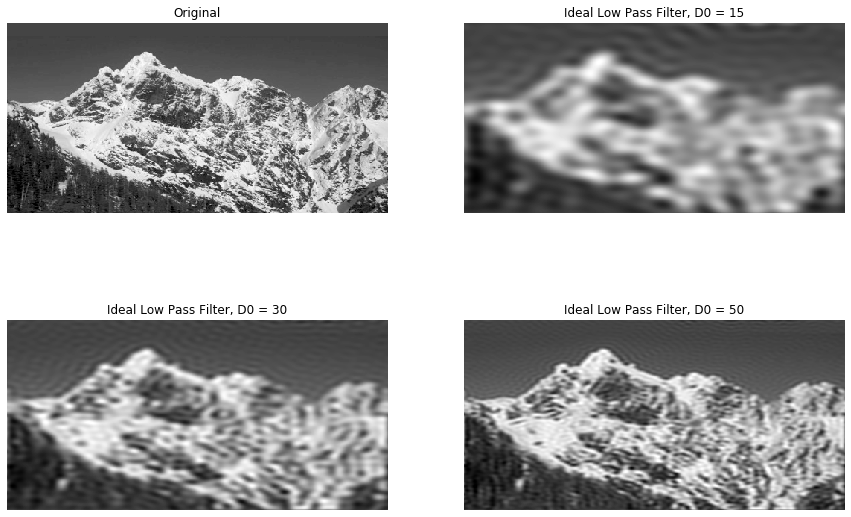

In [133]:
fig1, axes1 = plt.subplots(2,2, figsize = (15,10))

axes1[0][0].imshow(mountain_img, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[0][1].imshow(mountain_lowpass_15.real, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title(f"Ideal Low Pass Filter, D0 = 15")

axes1[1][0].imshow(mountain_lowpass_30.real, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title(f"Ideal Low Pass Filter, D0 = 30")

axes1[1][1].imshow(mountain_lowpass_50.real, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title(f"Ideal Low Pass Filter, D0 = 50")

plt.show()

As the distance D0 is increased, we increase the range of low frequencies allowed, and this results in deblurring of image. When we will set the D0 > max possible distance for the image, we will be allowing all the frequencies to pass through, hence the output will be the original image.
<br>As D0 decreases, blurring of the image increases.

__2. Apply gaussion lowpass filter in the frequency domain for image mountain.png.
Try for D0 values = 30, 15 and 50 (D0 refers to the measure of spread in a gaussian
curve).
Include the original image and all three gaussian lowpass filtered images and briefly
discuss your results.__

In [134]:
def gaussian_lowpass_filter(img, D):
    fourier_img = center_shift_2d(fft_2d(img))
    m, n = fourier_img.shape[0], fourier_img.shape[1]
    D_sqr_2 = -2 * D**2
    center = ((m-1)/2, (n-1)/2)
    for u in range(m):
        for v in range(n):
            fourier_img[u,v] *= np.exp(distance_sqr((u,v), center) / D_sqr_2)
    return ifft_2d(inverse_center_shift_2d(fourier_img))

In [135]:
mountain_lowpass_15 = gaussian_lowpass_filter(mountain_img, 15)
mountain_lowpass_30 = gaussian_lowpass_filter(mountain_img, 30)
mountain_lowpass_50 = gaussian_lowpass_filter(mountain_img, 50)

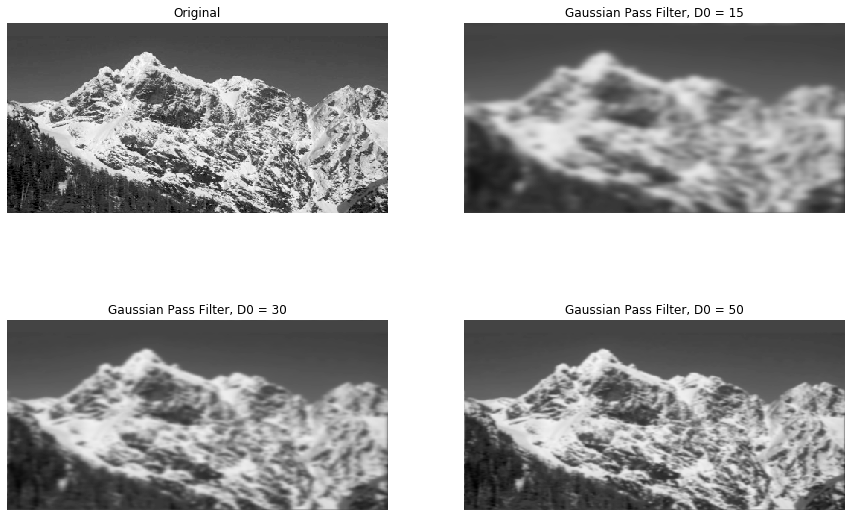

In [136]:
fig1, axes1 = plt.subplots(2,2, figsize = (15,10))

axes1[0][0].imshow(mountain_img, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][0].axis('off')
axes1[0][0].set_title('Original')

axes1[0][1].imshow(mountain_lowpass_15.real, cmap = "gray", vmin = 0, vmax = 255)
axes1[0][1].axis('off')
axes1[0][1].set_title(f"Gaussian Pass Filter, D0 = 15")

axes1[1][0].imshow(mountain_lowpass_30.real, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][0].axis('off')
axes1[1][0].set_title(f"Gaussian Pass Filter, D0 = 30")

axes1[1][1].imshow(mountain_lowpass_50.real, cmap = "gray", vmin = 0, vmax = 255)
axes1[1][1].axis('off')
axes1[1][1].set_title(f"Gaussian Pass Filter, D0 = 50")

plt.show()

As the distance D0 is increased, we increase the range of low frequencies allowed, and this results in deblurring of image. When we will set the D0 > max possible distance for the image, we will be allowing all the frequencies to pass through, hence the output will be the original image.
<br>As D0 decreases, blurring of the image increases, similar to Ideal low pass filter

__3. Discuss the difference between your results for gaussian lowpass filtering and ideal
lowpass filtering.__

As Gaussian lowpass filter is a smoother function and Ideal lowpass is a step function, we can observe similar effects in the output images. For gaussian, we can observe smoother blurring as D0 decreases, whereas for ideal, we can observe a ringing effect in the images (due to the sudden cutoff D0), and the images are less smooth.

---

## 9. Morphological Operations

__Morphological gradient is one of the morphological operators which is used for generating the outline of the image. The gradient can be obtained using a combination of
morphological operators like dilation, erosion, closing and opening.
<br>Explain the combination of operations and choice of structuring element used while
performing morphological gradient on the input image eye.png.__

By definition, Morphological gradient is defined as difference between Dilation minus Erosion of an image. Hence, I am also using the same.

In [146]:
# Equivalent to min filter on structing element
def erosion(img, kernel, origin):
    zero_padding_h = kernel.shape[0] // 2
    zero_padding_w = kernel.shape[1] // 2
    
    in_img = np.zeros((img.shape[0] + 2 * zero_padding_h, img.shape[1] + 2 * zero_padding_w), int)
    
    left = origin[0]
    top = origin[1]
    
    in_img[left : left + img.shape[0], top : top + img.shape[1]] = img
    
#     for i in range(left):
#         in_img[i] = img[0]
        
#     for i in range(left + img.shape[0], in_img.shape[0]):
#         in_img[i] = img[img.shape[0] - 1]
        
#     for i in range(top):
#         in_img[:,i] = img[:,i]
        
#     for i in range(top + img.shape[1], in_img.shape[1]):
#         in_img[:,i] = img[img.shape[1] - 1]
    
    kernel_ones = kernel == 1
        
    new_img = np.zeros((img.shape[0], img.shape[1]), int)
    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):
            new_img[i][j] = np.min((in_img[i:i + kernel.shape[0], j:j + kernel.shape[1]])[kernel_ones])
            
    return new_img

# Equivalent to max filter on structing element
def dilation(img, kernel, origin):
    zero_padding_h = kernel.shape[0] // 2
    zero_padding_w = kernel.shape[1] // 2
    
    in_img = np.zeros((img.shape[0] + 2 * zero_padding_h, img.shape[1] + 2 * zero_padding_w), int)
    
    left = origin[0]
    top = origin[1]
    
    in_img[left : left + img.shape[0], top : top + img.shape[1]] = img
    
#     for i in range(left):
#         in_img[i] = img[0]
        
#     for i in range(left + img.shape[0], in_img.shape[0]):
#         in_img[i] = img[img.shape[0] - 1]
        
#     for i in range(top):
#         in_img[:,i] = img[:,i]
        
#     for i in range(top + img.shape[1], in_img.shape[1]):
#         in_img[:,i] = img[img.shape[1] - 1]
    
    kernel_ones = kernel == 1
        
    new_img = np.zeros((img.shape[0], img.shape[1]), int)
    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):
            new_img[i][j] = np.max((in_img[i:i + kernel.shape[0], j:j + kernel.shape[1]])[kernel_ones])
            
    return new_img

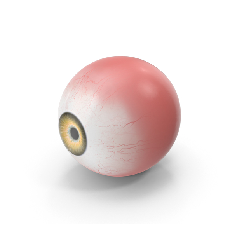

In [138]:
eye_image = readRgbImage("eye.png")
showImage(eye_image)

In [139]:
# kernel = np.zeros((3,3))
# kernel[0,0] = 1
# kernel[0,2] = 1
# img = np.arange(9).reshape((3,3))
# img[kernel == 1]

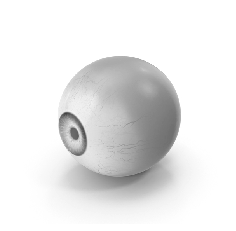

In [140]:
eye_gray = readImageAsGray("eye.png")
showImage(eye_gray)

In [141]:
k = 3
se_kernel = np.ones((k, k))
origin = (se_kernel.shape[0]//2, se_kernel.shape[1]//2)

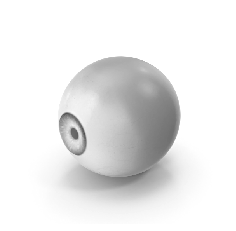

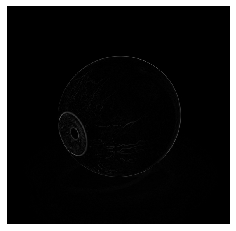

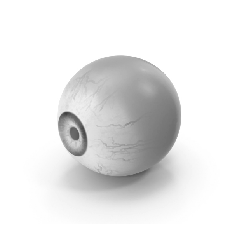

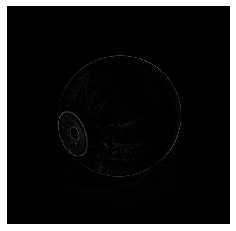

In [142]:
showImage((dilation(eye_gray, se_kernel, origin)))
showImage((dilation(eye_gray, se_kernel, origin)) - eye_gray)
showImage((erosion(eye_gray, se_kernel, origin)))
showImage(eye_gray - (erosion(eye_gray, se_kernel, origin)))

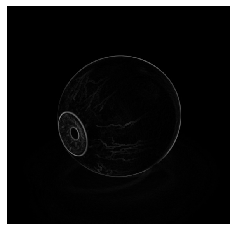

In [143]:
showImage((dilation(eye_gray, se_kernel, origin) - (erosion(eye_gray, se_kernel, origin))))

In [144]:
# se_kernel = np.array([[1, 1, 1], 
#                       [1, 1, 1], 
#                       [1, 1, 1]])
k = 15
se_kernel = np.ones((k, k))
origin = (se_kernel.shape[0]//2, se_kernel.shape[1]//2)

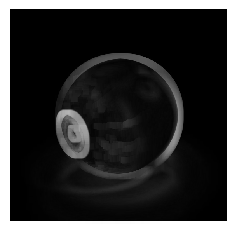

In [145]:
showImage((dilation(eye_gray, se_kernel, origin) - erosion(eye_gray, se_kernel, origin)))

The larger the kernel size, the thickness of edges increases, but the edge image also becomes increasingly blurry.

In [146]:
k = 5
se_kernel = np.ones((k, k))
origin = (se_kernel.shape[0]//2, se_kernel.shape[1]//2)

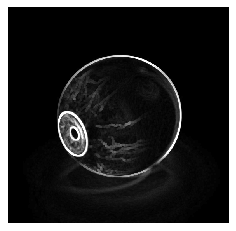

In [147]:
showImage(3 * (dilation(eye_gray, se_kernel, origin) - erosion(eye_gray, se_kernel, origin)))

Morphological gradient with Structuring element shaped as 5 * 5 pixel filled square (np.ones((5,5))), multiplied by 3 to amplify the gradient, gives best result. Dilation thickens the boundaries and Erosion thins them out. So a difference between dilated image and original image gives the outer boundary and the difference image and eroded image gives internal boundary. Hence difference between the dilated and eroded images gives a thicker boundary than the other 2 operations.

___

## 10. Geometrical Transformations

__1. Write a function rotImage which rotates an input image about its center and takes
the following parameters:
<br>• Input Image
<br>• Angle of rotation in degrees
<br>Note: The output dimensions should accommodate the entire image (without
cropping) after rotation.__

In [148]:
# anticlockwise = +ve theta
def rotImage(img, theta):
    if theta % 360 == 0:
        return img
    
    h, w = img.shape[0], img.shape[1]
    
    cos = np.cos(np.deg2rad(theta))
    sin = np.sin(np.deg2rad(theta))
    
    new_h = int(np.round(np.abs(h * cos) + np.abs(w * sin)))
    new_w = int(np.round(np.abs(h * sin) + np.abs(w * cos)))
    
    # because we are mapping new coordinates to old coordinates, and not the vice versa
    # backward mapping
    R_T = np.array([[cos, -sin],
                    [sin, cos]]).T
    
    h_c, w_c = (h-1)/2, (w-1)/2
    new_h_c, new_w_c = (new_h-1)/2, (new_w-1)/2
    
    if len(img.shape) == 2:
        new_image = np.zeros((new_h, new_w), int)
    else:
        new_image = np.zeros((new_h, new_w, img.shape[2]), int)
    
    for i in range(new_image.shape[0]):
        for j in range(new_image.shape[1]):
            old_coords = np.dot(R_T, np.array([[i - new_h_c], [j - new_w_c]]))
            old_i = np.int(np.round(old_coords[0][0] + h_c))
            old_j = np.int(np.round(old_coords[1][0] + w_c))
            # nearest neighbour
            if (old_i >= -1 and old_i < img.shape[0] and old_j >= -1 and old_j < img.shape[1]):
                new_image[i][j] = img[old_i][old_j]
            
    return new_image

In [149]:
# from PIL import Image

# colorImage  = Image.open("../images/girl.jpg")

# # Rotate it by 45 degrees
# rotated     = colorImage.rotate(30)
# showImage(rotated)

__2. Show outputs of a rectangular image of your choice with angle 30°, 45°, 90° and 2
other angles of your choice.__

In [150]:
girl_image = readRgbImage("girl.jpg")
girl_image_gray = readImageAsGray("girl.jpg")

In [151]:
angles = [0, 30, 45, 90, 180, -150]
rot_images = [rotImage(girl_image, theta) for theta in angles]
rot_images_gray = [rotImage(girl_image_gray, theta) for theta in angles]

In [152]:
# (rot_images[3] == cv2.rotate(girl_image, 2)).all()

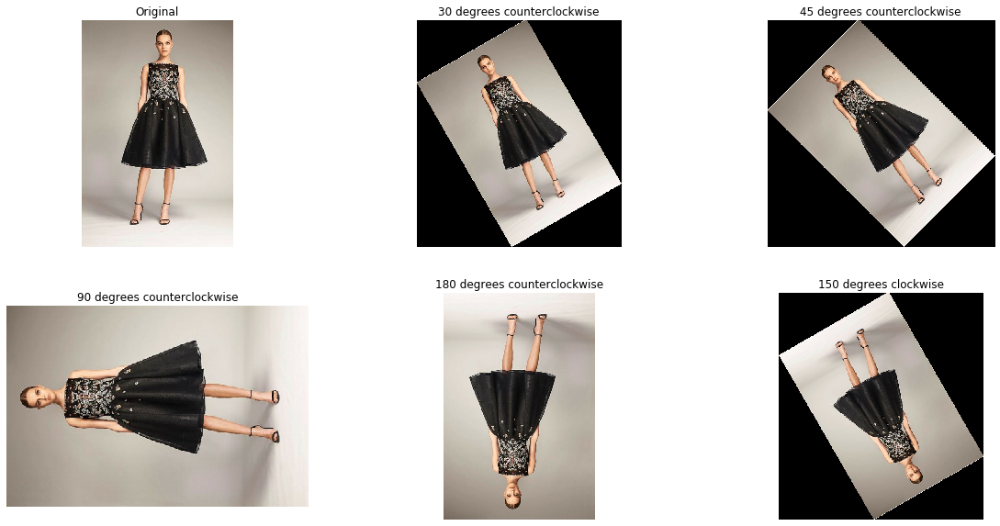

In [153]:
fig1, axes1 = plt.subplots(2,3, figsize = (20,10))

for i in range(len(rot_images)):
    x, y = i // 3, i % 3
    axes1[x][y].imshow(rot_images[i])
    axes1[x][y].axis('off')
    axes1[x][y].set_title(f"{angles[i]} degrees counterclockwise")
    
axes1[0][0].set_title("Original")
axes1[1][2].set_title(f"{-angles[5]} degrees clockwise")
plt.show()

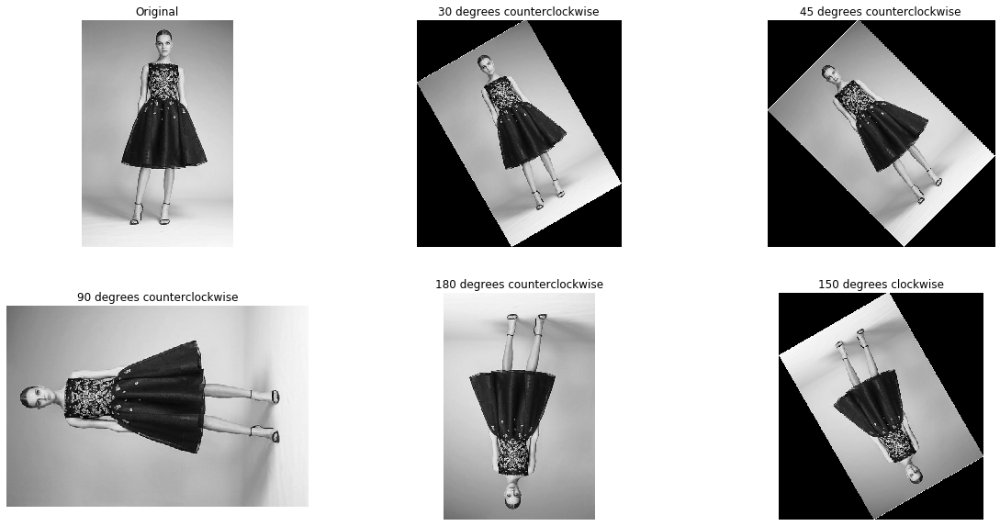

In [154]:
fig1, axes1 = plt.subplots(2,3, figsize = (20,10))

for i in range(len(rot_images_gray)):
    x, y = i // 3, i % 3
    axes1[x][y].imshow(rot_images_gray[i], cmap = 'gray')
    axes1[x][y].axis('off')
    axes1[x][y].set_title(f"{angles[i]} degrees counterclockwise")
    
axes1[0][0].set_title("Original")
axes1[1][2].set_title(f"{-angles[5]} degrees clockwise")
plt.show()

---

## 11. Image Denoising
__Use a combination of any of the techniques in this assignment to bring corruptedLena.jpg
as close to lena.jpg as possible. Explain your process.__

In [85]:
def band_reject_filter(img, D_range):
    fourier_img = center_shift_2d(np.fft.fft2(img))
    m, n = fourier_img.shape[0], fourier_img.shape[1]
    D_sqr_low = D_range[0]**2
    D_sqr_high = D_range[1]**2
    center = ((m-1)/2, (n-1)/2)
    for u in range(m):
        for v in range(n):
            d = distance_sqr((u,v), center)
            if d >= D_sqr_low and d <= D_sqr_high:
                fourier_img[u,v] = 0
    return np.fft.ifft2(inverse_center_shift_2d(fourier_img))

In [9]:
def notch_reject_filter(img, D_range):
#     fourier_img = img
    fourier_img = center_shift_2d(np.fft.fft2(img))
    m, n = fourier_img.shape[0], fourier_img.shape[1]
    center = ((m-1)//2, (n-1)//2)
    
    fourier_img[center[0]+D_range[0]:center[0]+D_range[1]+1, :] = 0
    fourier_img[center[0]-D_range[1]:center[0]-D_range[0]+1, :] = 0
    
    fourier_img[:, center[1]+D_range[0]:center[1]+D_range[1]+1] = 0
    fourier_img[:, center[1]-D_range[1]:center[1]-D_range[0]+1] = 0
    
#     return img
    return np.fft.ifft2(inverse_center_shift_2d(fourier_img))

In [157]:
def gaussian_band_reject_filter(img, D, W):
    fourier_img = center_shift_2d(np.fft.fft2(img))
    m, n = fourier_img.shape[0], fourier_img.shape[1]
    W_sqr = W**2
    D_sqr = D**2
    center = ((m-1)/2, (n-1)/2)
    for u in range(m):
        for v in range(n):
            d = distance_sqr((u,v), center)
            fourier_img[u,v] *= (1-np.exp(-np.square(d - D_sqr) / W_sqr / d))
    return np.fft.ifft2(inverse_center_shift_2d(fourier_img))

In [158]:
def butterworth_band_reject_filter(img, D, W, n):
    fourier_img = center_shift_2d(np.fft.fft2(img))
    m, n = fourier_img.shape[0], fourier_img.shape[1]
#     W_sqr = W**2
    D_sqr = D**2
    center = ((m-1)/2, (n-1)/2)
    for u in range(m):
        for v in range(n):
            d = distance_sqr((u,v), center)
            fourier_img[u,v] *= 1 / (1+ np.power(np.sqrt(d)*W/(d - D_sqr),2*n))
    return np.fft.ifft2(inverse_center_shift_2d(fourier_img))

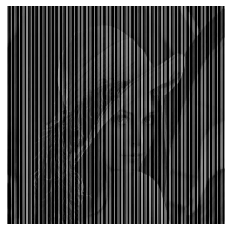

In [4]:
corrupted_lena = readImageAsGray("corruptedLena.jpg")
showImage(corrupted_lena)

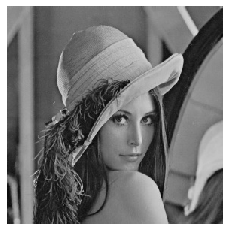

In [5]:
original_lena = readImageAsGray("lena.jpg")
showImage(original_lena)

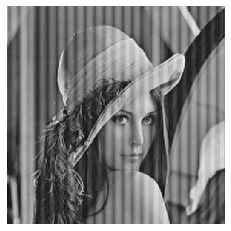

In [180]:
im1 = ideal_lowpass_filter(corrupted_lena, 100)
plt.imshow(im1.real, cmap = 'gray')
plt.axis('off')
plt.show()

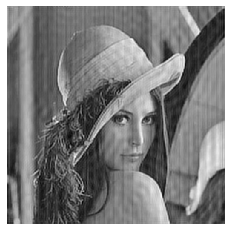

In [181]:
im2 = band_reject_filter(im1, (22,25))
plt.imshow(im2.real, cmap = 'gray')
plt.axis('off')
plt.show()

We first remove all the higher frequencies using Lowpass filtering (D0 = 100), and then remove the frequencies for D0 = 22 to 25. We get an image close to the original one.

---

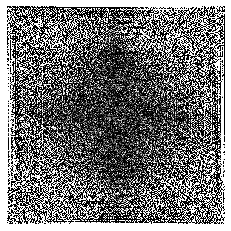

In [44]:
x1 = np.fft.fft2(cv2.resize(original_lena, (512,512)))
showImage(x1.real)

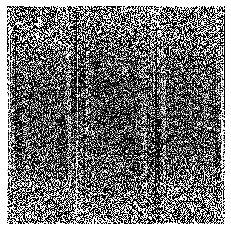

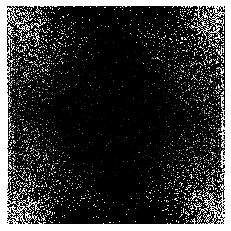

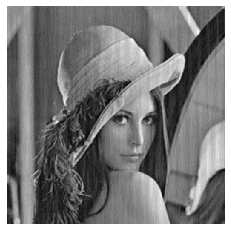

In [154]:
x2 = np.fft.fft2(corrupted_lena)

showImage(x2.real)

x2[np.abs(x2)/np.abs(x1) > 0.4] = 0
showImage((x2).real)
x2 = np.fft.ifft2(x2).real
plt.imshow(x2, cmap = 'gray')
plt.axis('off')
plt.show()

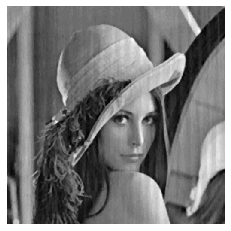

In [172]:
im3 = efficient_median_filter(x2, 5)
plt.imshow(im3.real, cmap = 'gray')
plt.axis('off')
plt.show()

I have taken the division of absolute values of fourier transforms of original lena and corrupted lena pixel by pixel. I have then set all the pixel values >  0.4 (in the frequency domain) for corrupted image to be zero and taken inverse FT. Then I have applied median filter with kernel size 5

---

In [163]:
# im3 = ideal_lowpass_filter(corrupted_lena, 75)
# plt.imshow(im3.real, cmap = 'gray')

In [164]:
# # im4 = notch_reject_filter(im3, (21,25))
# im4 = center_shift_2d(np.fft.fft2(im3))
# im4[:, 230:234] = 0
# im4[:, 277:281] = 0
# # im4[:, 254:258] = 0
# im4 = (np.fft.ifft2(inverse_center_shift_2d(im4)))
# plt.imshow(im4.real, cmap = 'gray')

In [165]:
# im4 = gaussian_band_reject_filter(im3, 23, 3)
# plt.imshow(im4.real, cmap = 'gray')

In [166]:
# im4 = butterworth_band_reject_filter(im3, 23, 2, 4)
# plt.imshow(im4.real, cmap = 'gray')

In [167]:
# plt.imshow(center_shift_2d(np.fft.fft2(im4)).real, cmap = 'gray', vmin = 0, vmax = 255)
# plt.xlim([185,325])
# plt.ylim([185,325])

In [168]:
# np.log(1+np.abs(center_shift_2d(np.fft.fft2(im4))))

In [169]:
# im3 = bilateral_filter(im2.real, 13, 3, 3)
# plt.imshow(im3, cmap = 'gray')

In [170]:
# guess_img = np.copy(corrupted_lena)
# k = 15
# guess_img1 = bilateral_filter(dilation(guess_img, np.ones((1, k)), origin = (0,7)) + sobel_filter_5(corrupted_lena, Gradient_Direction.y, 2), 11, 4, 5)
# showImage(guess_img1)

In [171]:
# guess_im = center_shift_2d(np.fft.fft2(original_lena))
# plt.imshow(guess_im.real, cmap='gray', vmin = 0, vmax = 255)

In [172]:
# from mpl_toolkits.mplot3d import Axes3D

In [173]:
# imlab = np.fft.fftshift(np.fft.fft2(corrupted_lena))


# # surface map
# plt.figure(3)

# ax = plt.axes(projection='3d')

# y = range( imlab.shape[0] )
# x = range( imlab.shape[1] ) 
# X, Y = np.meshgrid(x, y)

# ax.plot_surface( X, Y, np.abs(imlab) )

# plt.show()

---